In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cptac
import binarization_functions as bf
import gseapy as gp
from gseapy.plot import barplot, heatmap, dotplot
import json
import requests
import random
import deva

In [3]:
co = cptac.Colon()
proteomics = co.get_proteomics()
clinical = co.get_clinical()

## Step 2: Data Cleaning and Choosing Attributes to A/B Test
First, we will drop columns we are not interested in, and then make each of the columns binary

In [4]:
for col in clinical.columns:
    print(col)
    print(clinical[col].value_counts())
    print('\n')

Patient_ID
06CO002     1
05CO011     1
11CO007N    1
11CO036N    1
20CO001N    1
           ..
20CO007N    1
01CO005     1
11CO030N    1
20CO004N    1
09CO022     1
Name: Patient_ID, Length: 210, dtype: int64


Sample_Tumor_Normal
Tumor     110
Normal    100
Name: Sample_Tumor_Normal, dtype: int64


Age
902.0     3
768.0     2
883.0     2
904.0     2
737.0     2
         ..
1065.0    1
1041.0    1
757.0     1
921.0     1
729.0     1
Name: Age, Length: 96, dtype: int64


Gender
Female    65
Male      45
Name: Gender, dtype: int64


Mucinous
Not Mucinous    88
Mucinous        21
Name: Mucinous, dtype: int64


Subsite
Sigmoid Colon       38
Ascending Colon     27
Cecum               23
Descending Colon    10
Hepatix Flexure      7
Splenic Flexure      3
Tranverse Colon      1
Name: Subsite, dtype: int64


pathalogy_T_stage
T3     80
T2     16
T4a    12
T4b     2
Name: pathalogy_T_stage, dtype: int64


pathalogy_N_stage
N0     56
N1b    18
N1a    14
N2a     9
N2b     7
N1      6
Name: path

In [5]:
cols_to_drop = ['Subsite', 'Patient_ID']

for col in clinical.columns:
    if len(clinical[col].value_counts()) < 2:
        cols_to_drop.append(col)

annotations = clinical.copy()
annotations = annotations.drop(cols_to_drop, axis=1)

In [6]:
# Minor Data Cleaning
for col in annotations.columns:
    if np.issubdtype(annotations[col].dtype, np.number):
        mean = annotations[col].mean()
        annotations[col]= bf.binarizeCutOff(annotations, col, mean,
                                            "Above_Mean("+str(round(mean, 2))+")",
                                            "Below_Mean("+str(round(mean, 2))+")")

In [8]:
annotations = deva.binarize_annotations(annotations)

## Step 3: Perform Outlier Analysis
Using the Blacksheep-outliers package, deva, we will create two tables: one of all the significant up-regulated genes per patient (which we will call outliers), and one of the q-values for significantly enriched genes based on our binarized clinical attributes (which we will call qvalues).

In [9]:
outliers, qvalues = deva.run_outliers(proteomics.transpose(), 
                                      annotations,
                                      up_or_down='up',
                                      aggregate=False)

09/10/2019 16:10:54:WARNING:These samples were not found in outliers table: S001, S012, S013, S015, S017, S038, S080, S081, S088, S089, S090, S099, S109, continuing without them. 
09/10/2019 16:10:54:WARNING:No rows tested for fisherFDR_Sample_Tumor_Normal_Tumor
09/10/2019 16:10:55:WARNING:No rows tested for fisherFDR_Sample_Tumor_Normal_Normal
09/10/2019 16:10:55:WARNING:These samples were not found in outliers table: S015, S017, S080, S081, S088, S099, S001, S012, S013, S038, S089, S090, S109, continuing without them. 
09/10/2019 16:10:55:WARNING:No rows tested for fisherFDR_Age_Below_Mean(779.51)
09/10/2019 16:10:55:WARNING:These samples were not found in outliers table: S012, S015, S017, S038, S080, S081, S089, S099, S109, S001, S013, S088, S090, continuing without them. 
09/10/2019 16:10:56:WARNING:These samples were not found in outliers table: S012, S013, S017, S038, S080, S081, S088, S089, S090, S099, S109, S001, S015, continuing without them. 
09/10/2019 16:10:56:WARNING:These

In [10]:
outliers_down, qvalues_down = deva.run_outliers(proteomics.transpose(), 
                                                annotations, 
                                                up_or_down='down', 
                                                aggregate=False)

09/10/2019 16:11:31:WARNING:These samples were not found in outliers table: S001, S012, S013, S015, S017, S038, S080, S081, S088, S089, S090, S099, S109, continuing without them. 
09/10/2019 16:11:31:WARNING:No rows tested for fisherFDR_Sample_Tumor_Normal_Tumor
09/10/2019 16:11:31:WARNING:No rows tested for fisherFDR_Sample_Tumor_Normal_Normal
09/10/2019 16:11:31:WARNING:These samples were not found in outliers table: S015, S017, S080, S081, S088, S099, S001, S012, S013, S038, S089, S090, S109, continuing without them. 
09/10/2019 16:11:31:WARNING:No rows tested for fisherFDR_Age_Below_Mean(779.51)
09/10/2019 16:11:31:WARNING:These samples were not found in outliers table: S012, S015, S017, S038, S080, S081, S089, S099, S109, S001, S013, S088, S090, continuing without them. 
09/10/2019 16:11:32:WARNING:These samples were not found in outliers table: S012, S013, S017, S038, S080, S081, S088, S089, S090, S099, S109, S001, S015, continuing without them. 
09/10/2019 16:11:32:WARNING:These

In [11]:
length = int(len(outliers.df.columns) / 2)
temp_outliers = outliers.df.transpose()
only_outliers_up = temp_outliers[:length]
outliers_up_dict = {}
for i in range(length):
    key = proteomics.index[i]
    my_filter = only_outliers_up.iloc[i] == 1.0
    value = list(only_outliers_up.iloc[i][my_filter].index.get_level_values('Name'))
    outliers_up_dict[key] = value

In [12]:
length = int(len(outliers_down.df.columns) / 2)
temp_outliers_down = outliers_down.df.transpose()
only_outliers_down = temp_outliers_down[:length]
outliers_down_dict = {}
for i in range(length):
    key = proteomics.index[i]
    my_filter = only_outliers_down.iloc[i] == 1.0
    value = list(only_outliers_down.iloc[i][my_filter].index.get_level_values('Name'))
    outliers_down_dict[key] = value

## Step 4: Visualize these enrichments

First, we will determine which clinical attributes have significant enrichments, and save them to a list for both up-regulated outliers, and down-regulated outliers.

In [13]:
#Drop Columns with less than 4 significant up-regulated enrichments
sig_cols_up = []
for col in qvalues.df.columns:
    sig_col = bf.significantEnrichments(qvalues.df, col)
    if sig_col is not None and len(sig_col) >= 4:
        sig_cols_up.append(sig_col)
    else:
        results_up = qvalues.df.drop(col, axis=1)

In [14]:
#Drop Columns with less than 4 significant down-regulated enrichments
sig_cols_down = []
for col in qvalues_down.df.columns:
    sig_col = bf.significantEnrichments(qvalues_down.df, col)
    if sig_col is not None and len(sig_col) >= 4:
        sig_cols_down.append(sig_col)
    else:
        results_down = qvalues_down.df.drop(col, axis=1)

In [15]:
#Here we will link clinical attributes with significantly up-regulated genes
sig_genes_up = {}
for i, col in enumerate(sig_cols_up):
    list_of_genes = list(col.index)
    sig_genes_up[sig_cols_up[i].columns[0][:-9]] = list_of_genes

In [16]:
#And then down-regulated genes
sig_genes_down = {}
for i, col in enumerate(sig_cols_down):
    list_of_genes = list(col.index)
    sig_genes_down[sig_cols_down[i].columns[0][:-9]] = list_of_genes

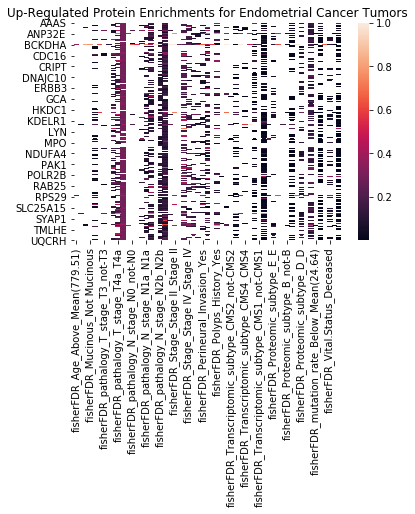

In [17]:
#Simple visualization
ax1 = plt.axes()
sns.heatmap(results_up, ax = ax1)
ax1.set_title('Up-Regulated Protein Enrichments for Endometrial Cancer Tumors')
plt.show()

09/10/2019 16:12:55:WARNING:No significant genes at FDR 0.05 in fisherFDR_Age_Above_Mean(779.51)


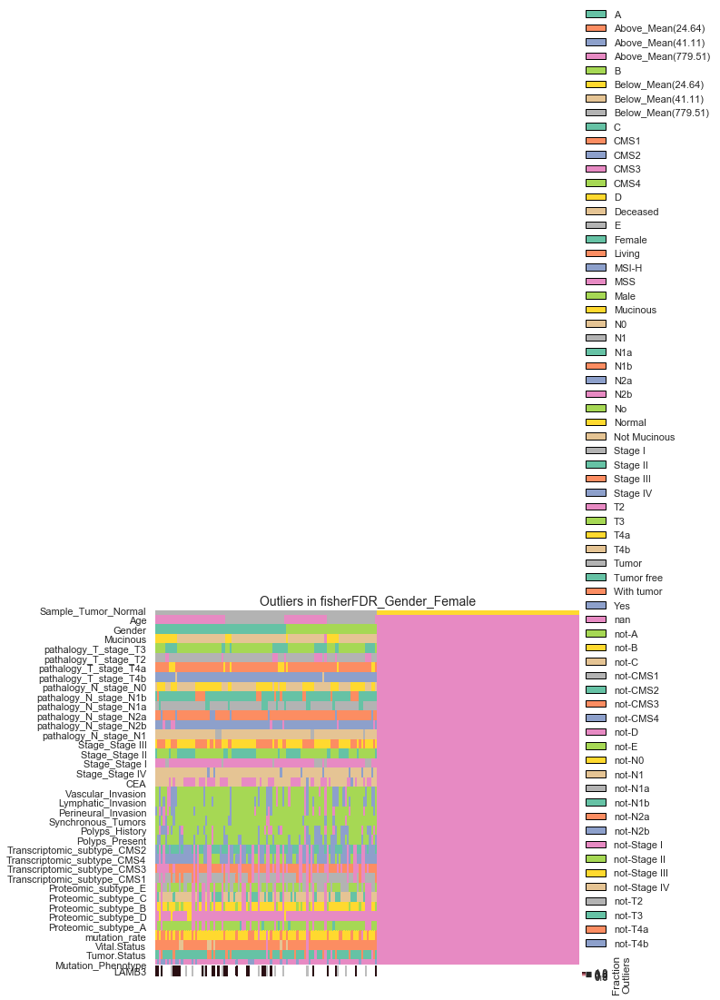

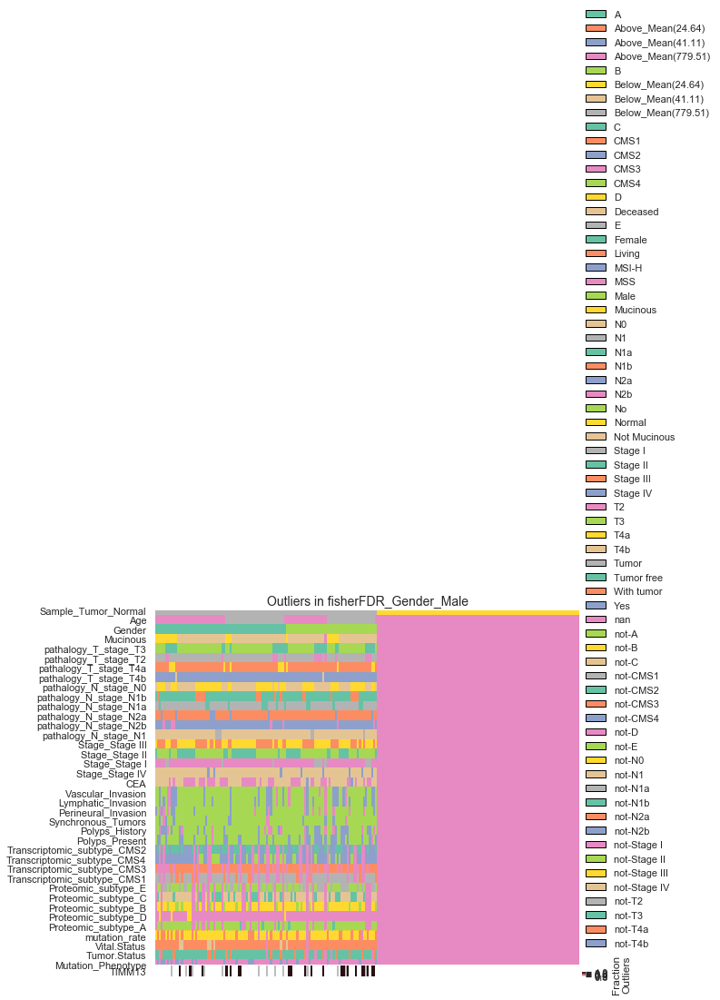

09/10/2019 16:13:03:WARNING:No significant genes at FDR 0.05 in fisherFDR_Mucinous_Not Mucinous


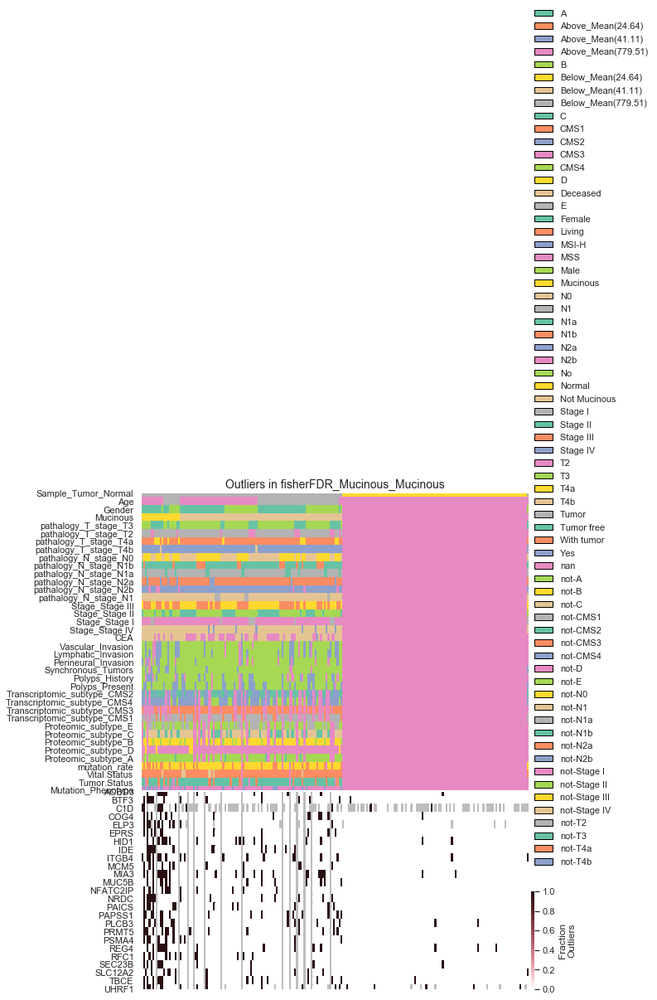

09/10/2019 16:13:08:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T3_T3


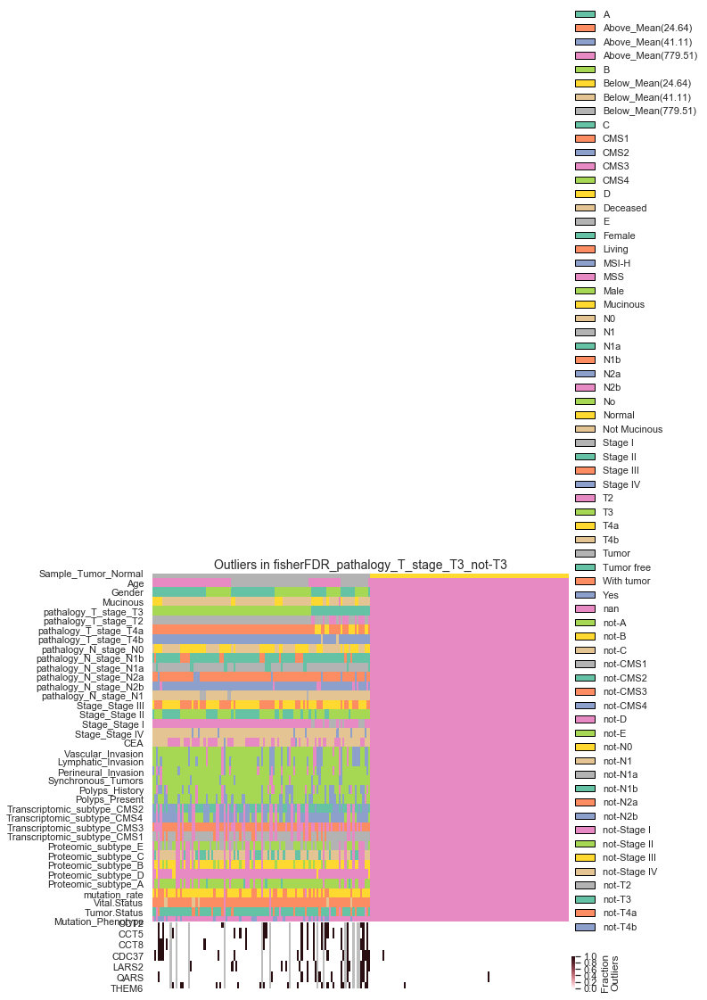

09/10/2019 16:13:14:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T2_not-T2
09/10/2019 16:13:14:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T2_T2
09/10/2019 16:13:14:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T4a_T4a
09/10/2019 16:13:15:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T4b_T4b
09/10/2019 16:13:15:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N0_N0


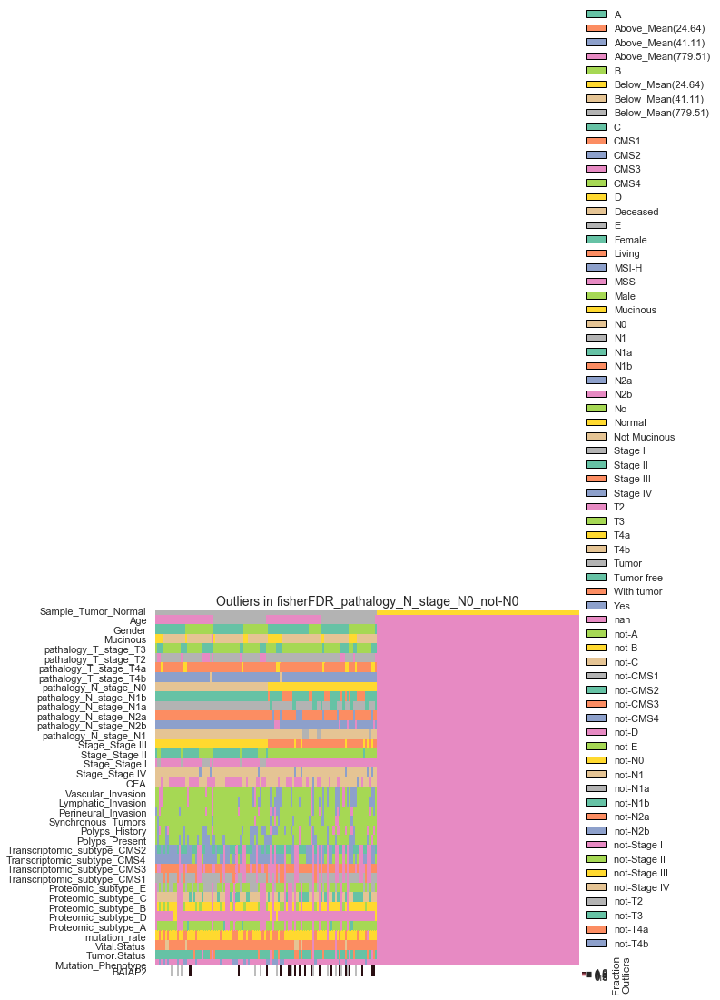

09/10/2019 16:13:22:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N1b_not-N1b


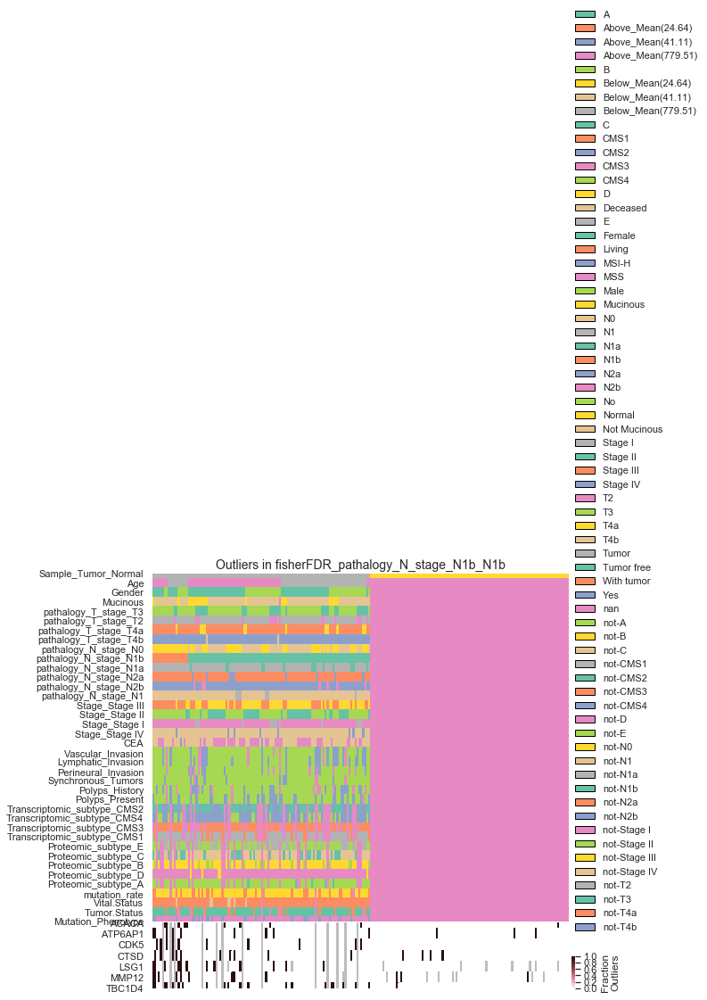

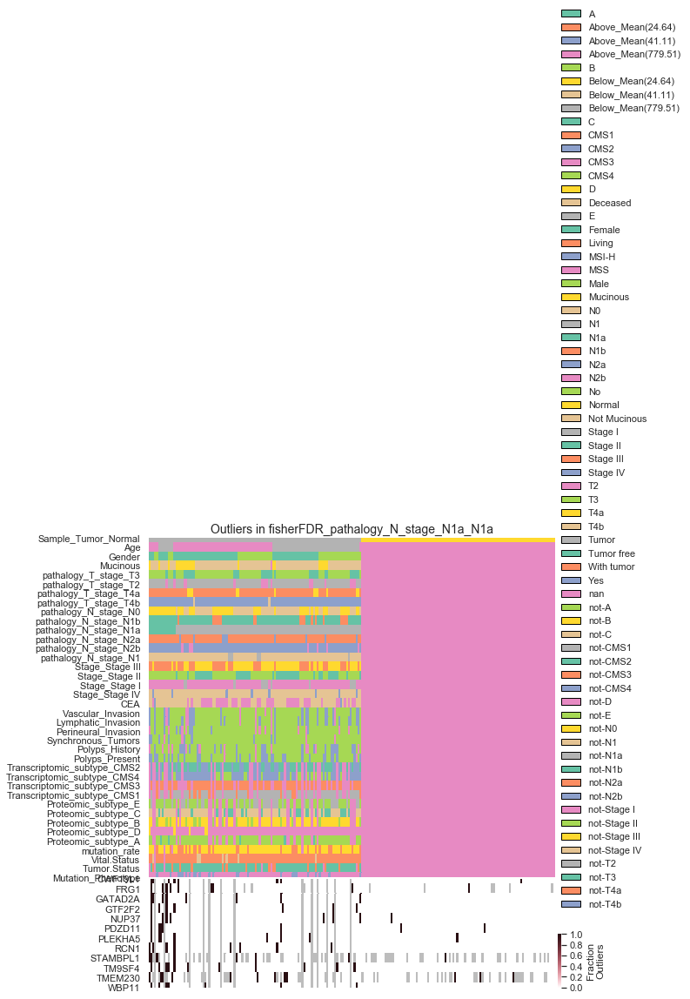

09/10/2019 16:13:35:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N2a_N2a
09/10/2019 16:13:35:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N2b_not-N2b


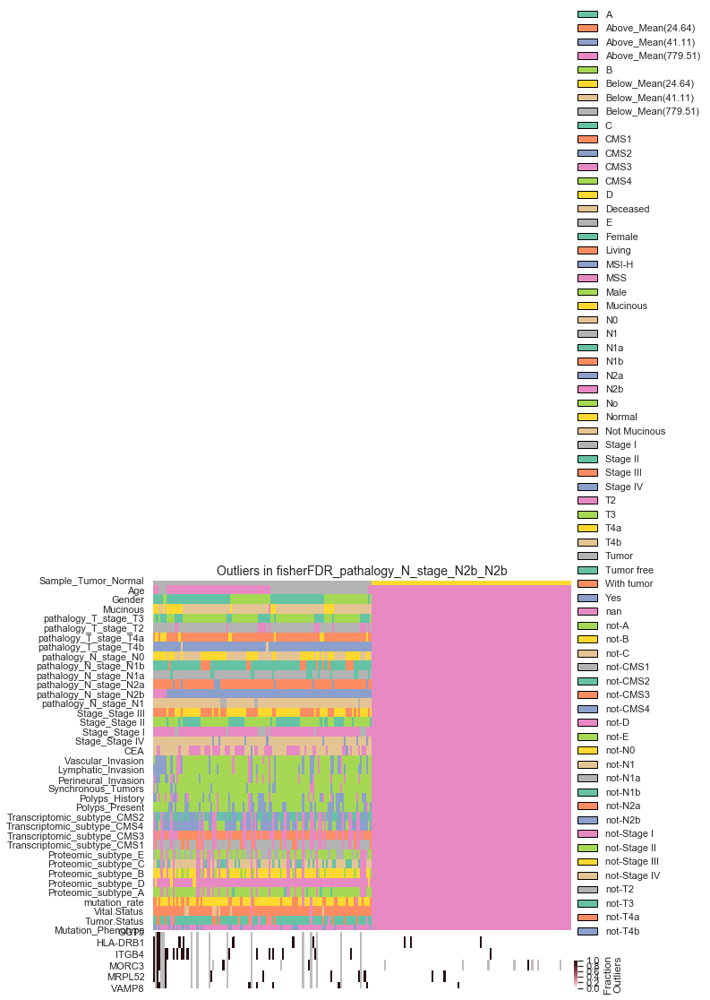

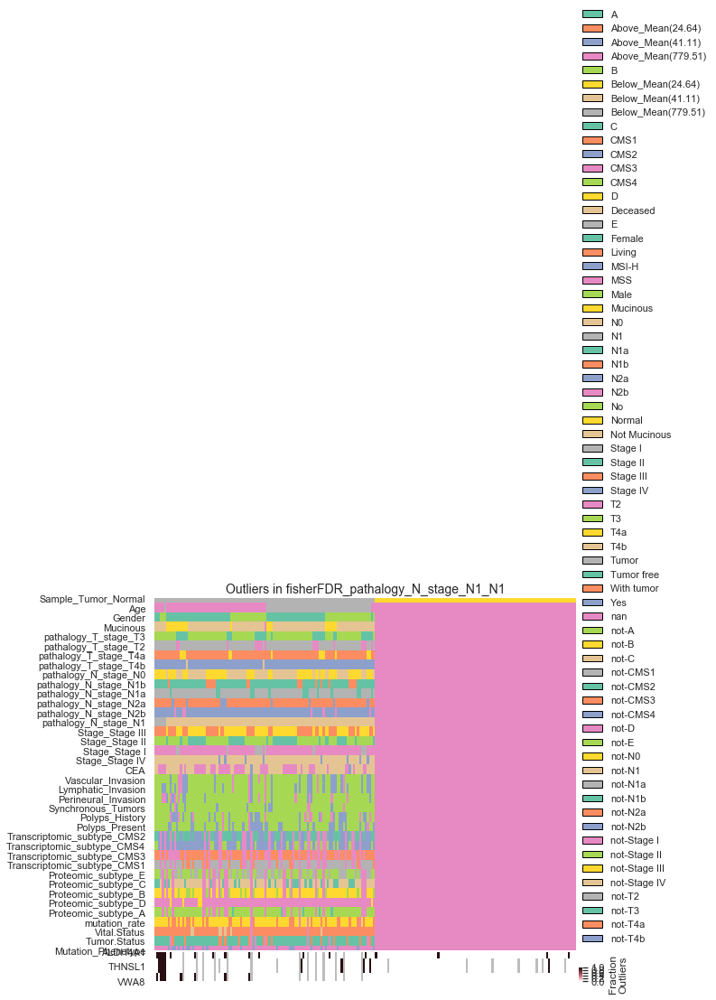

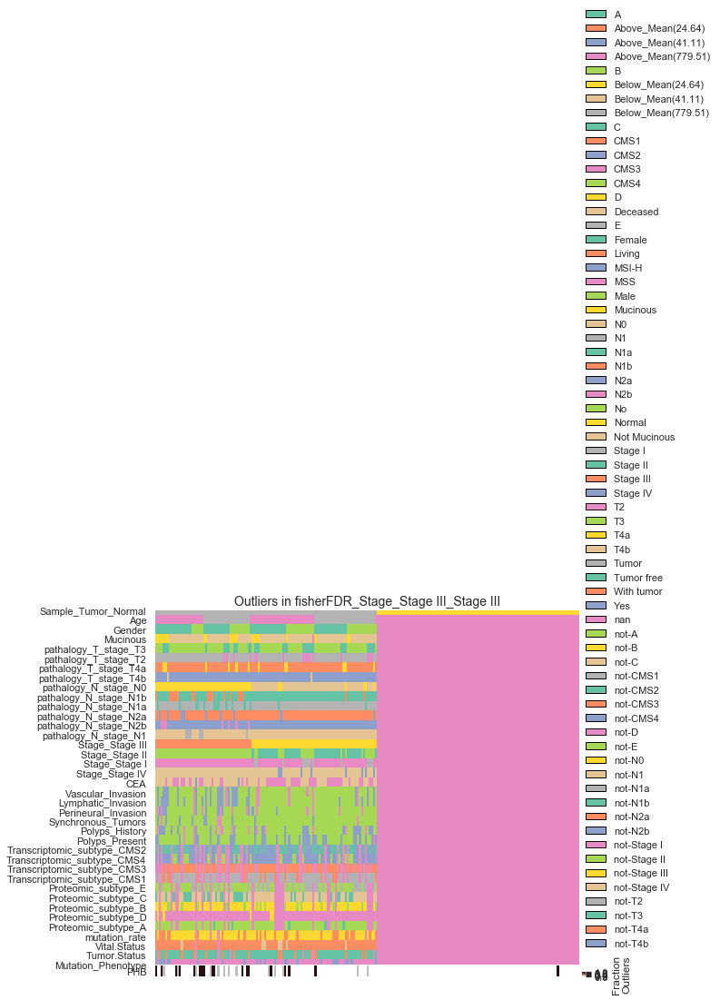

09/10/2019 16:13:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_Stage II_Stage II
09/10/2019 16:13:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_Stage I_not-Stage I
09/10/2019 16:13:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_Stage I_Stage I


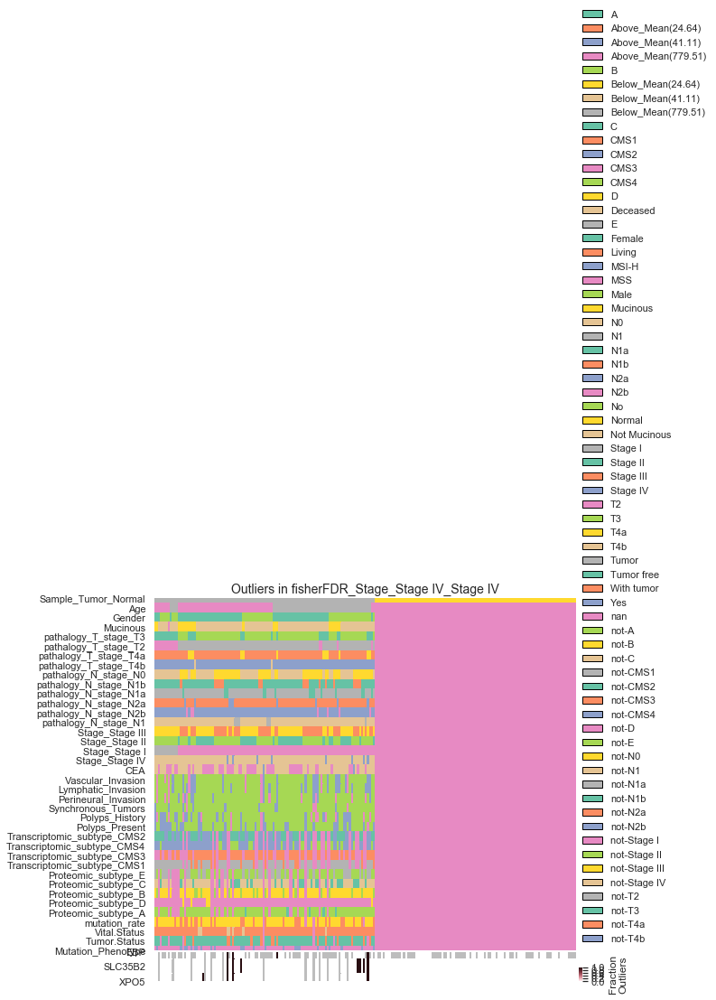

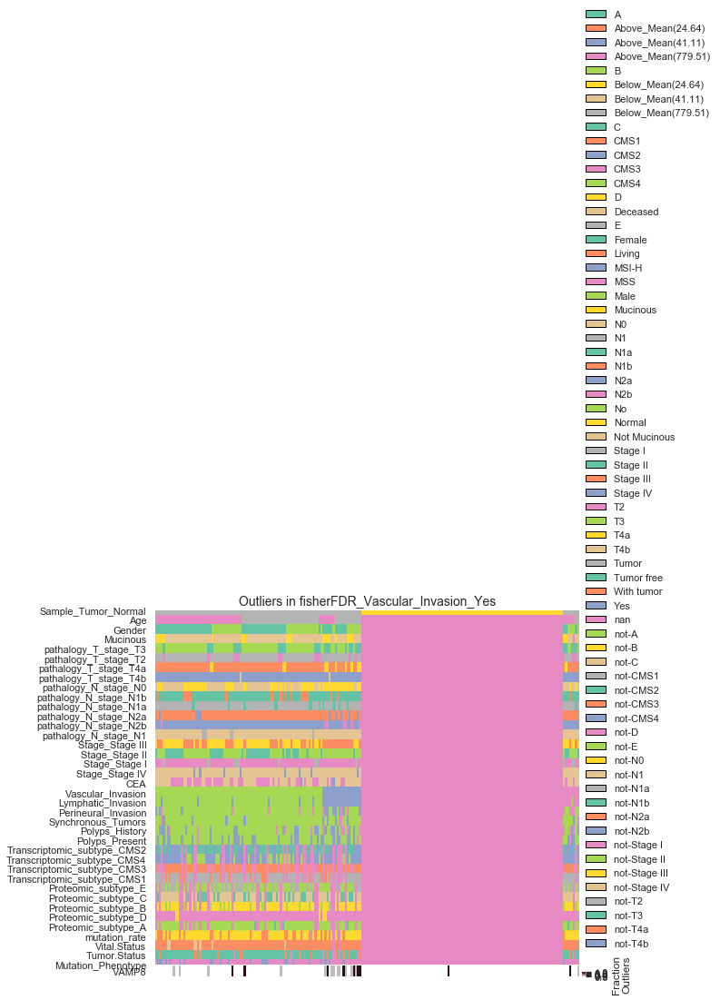

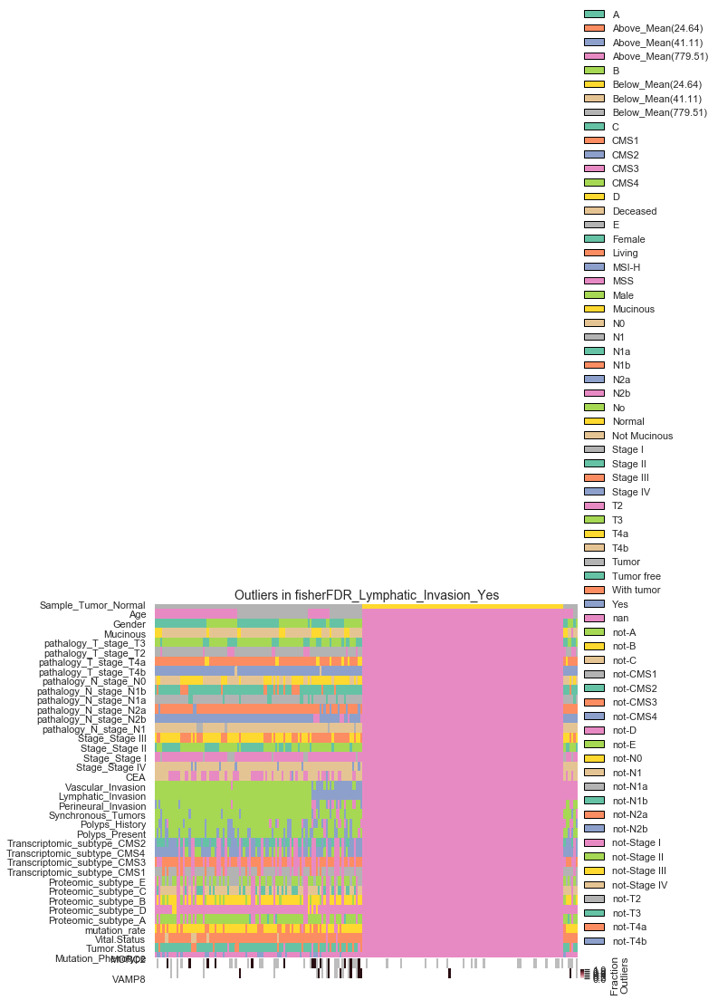

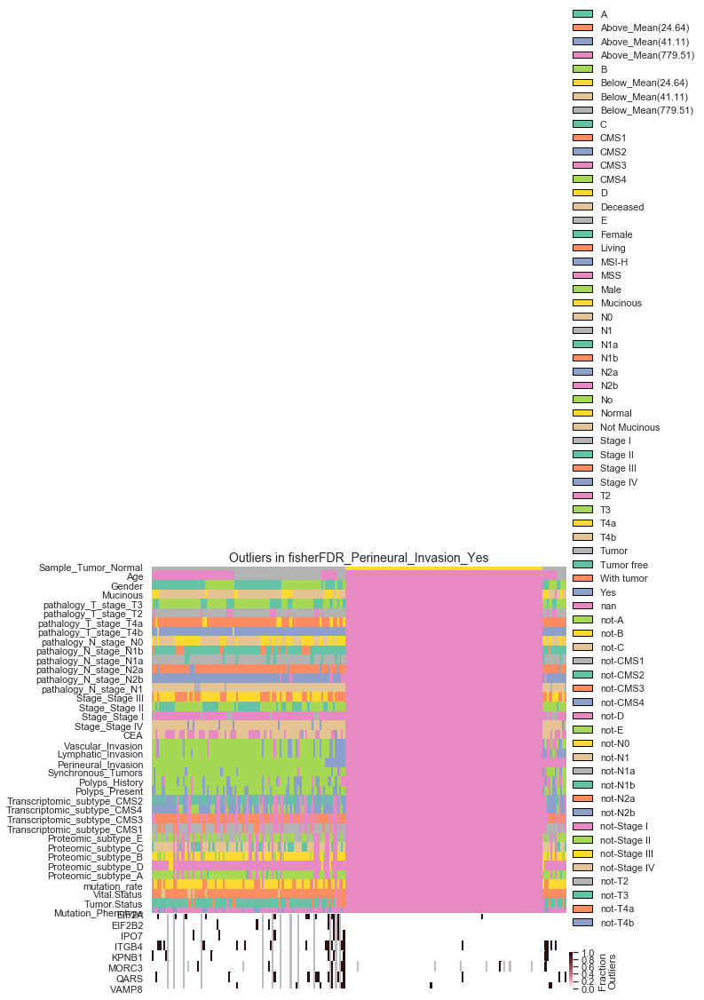

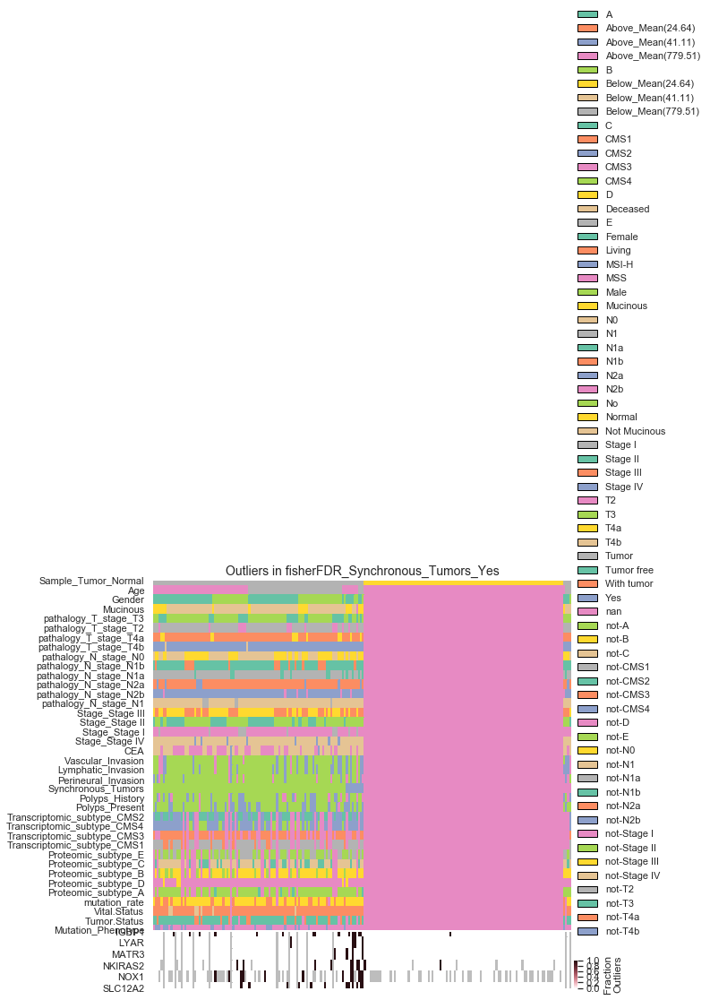

09/10/2019 16:14:05:WARNING:No significant genes at FDR 0.05 in fisherFDR_Polyps_History_No


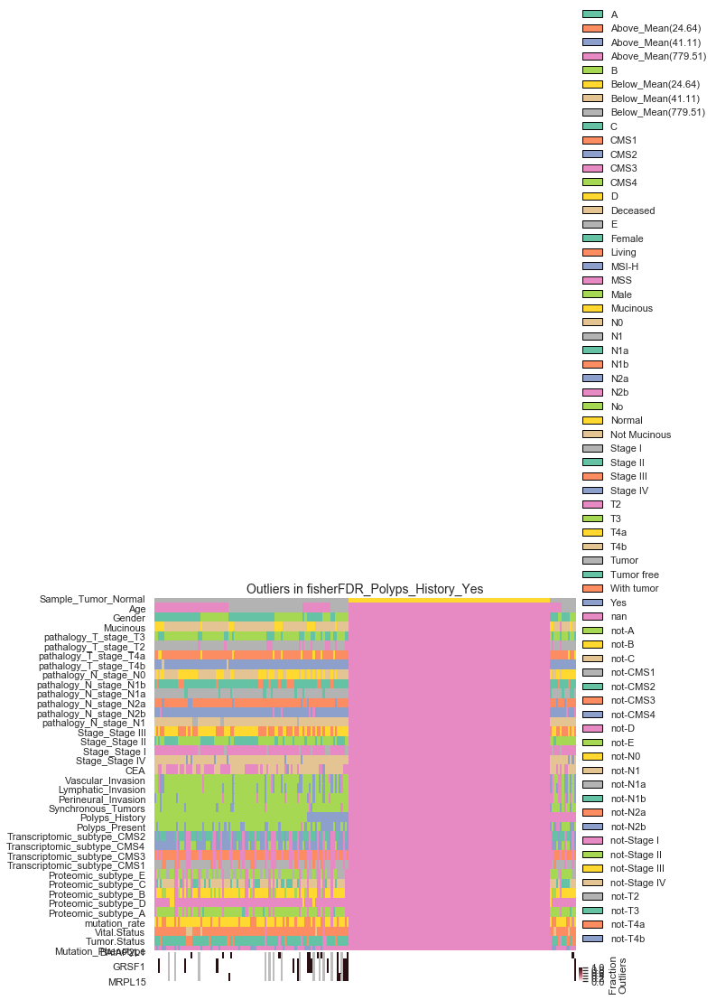

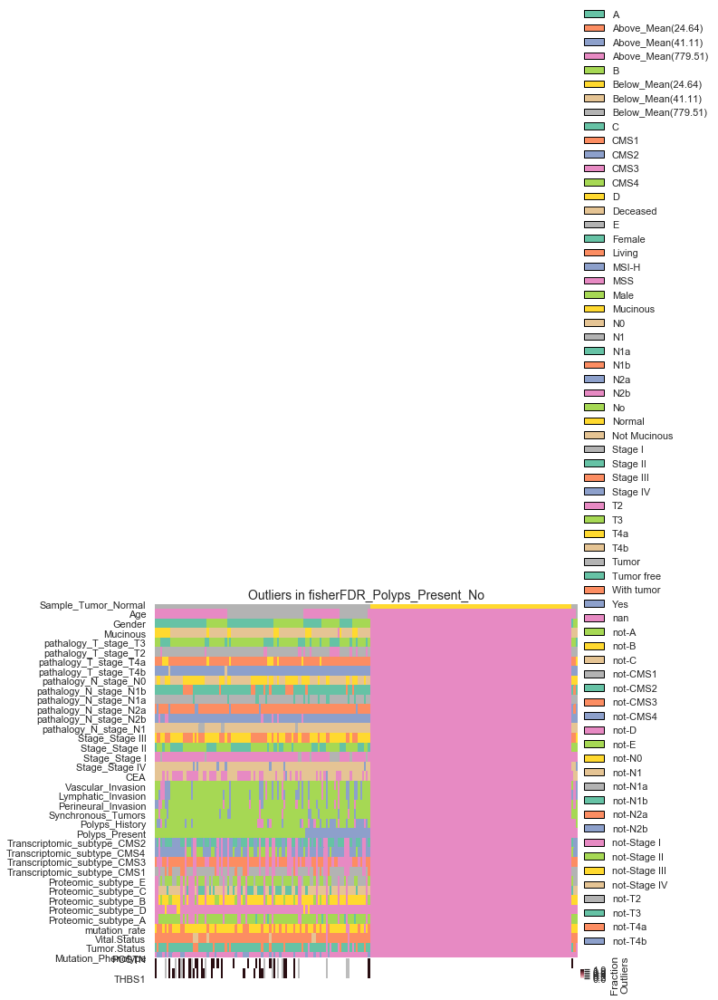

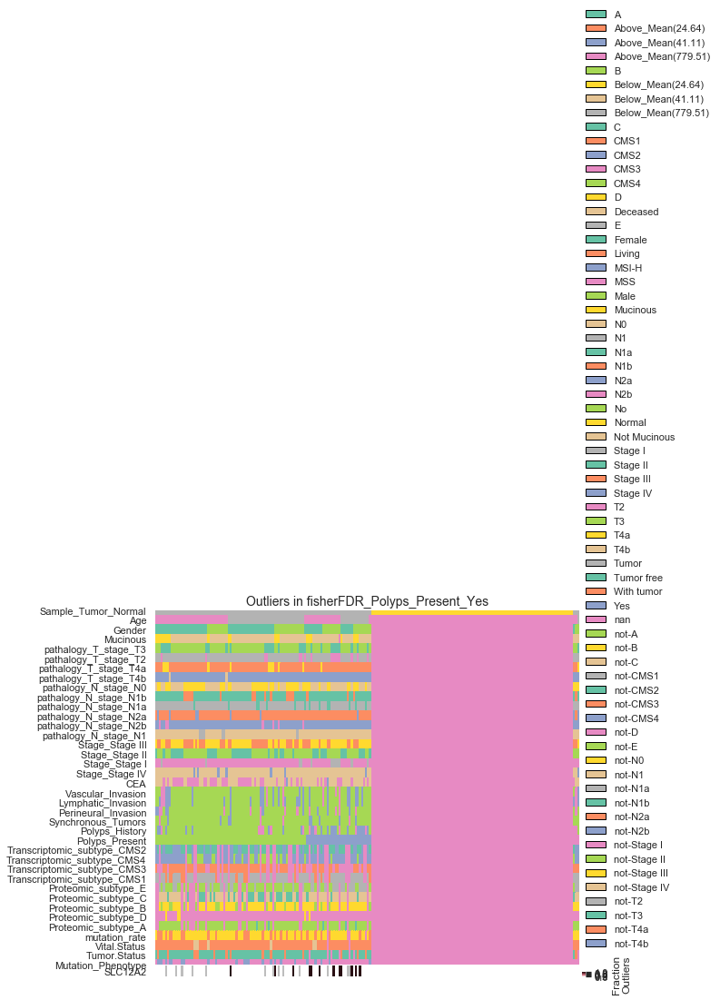

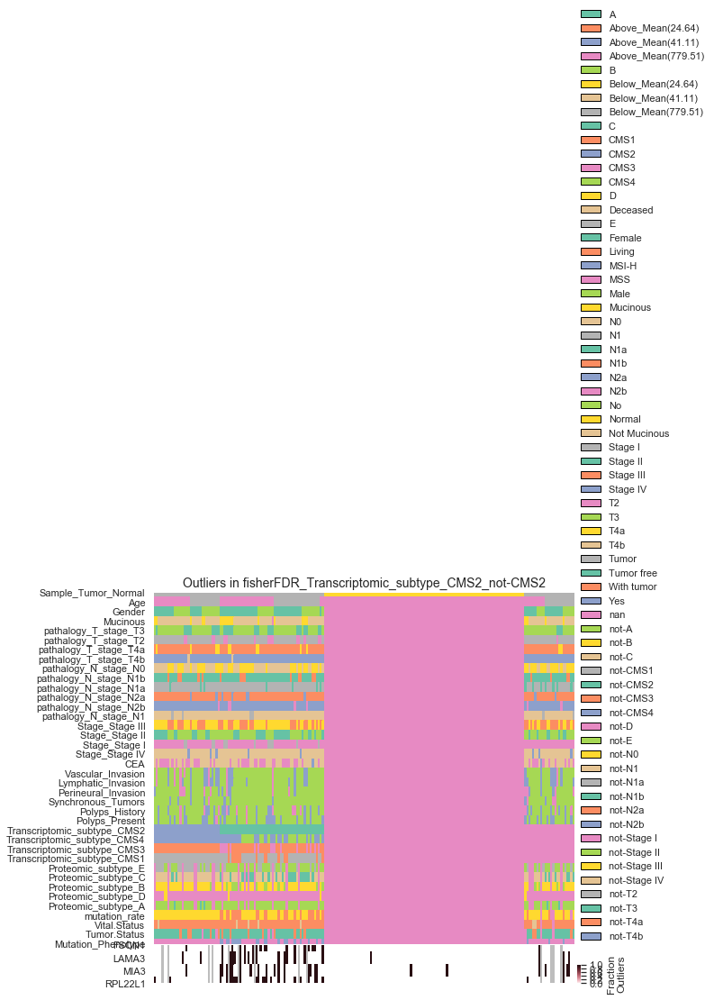

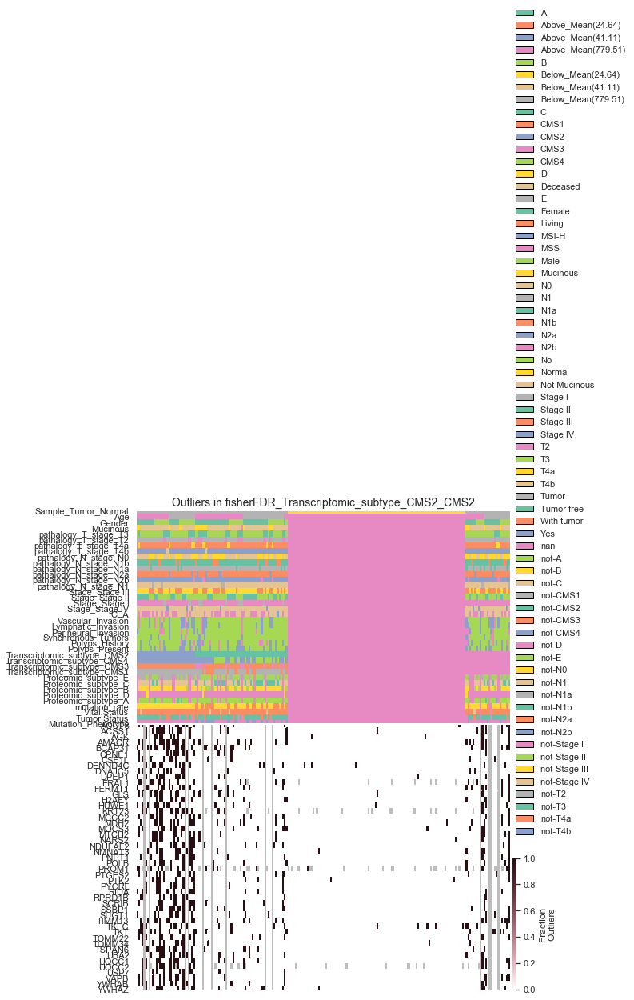

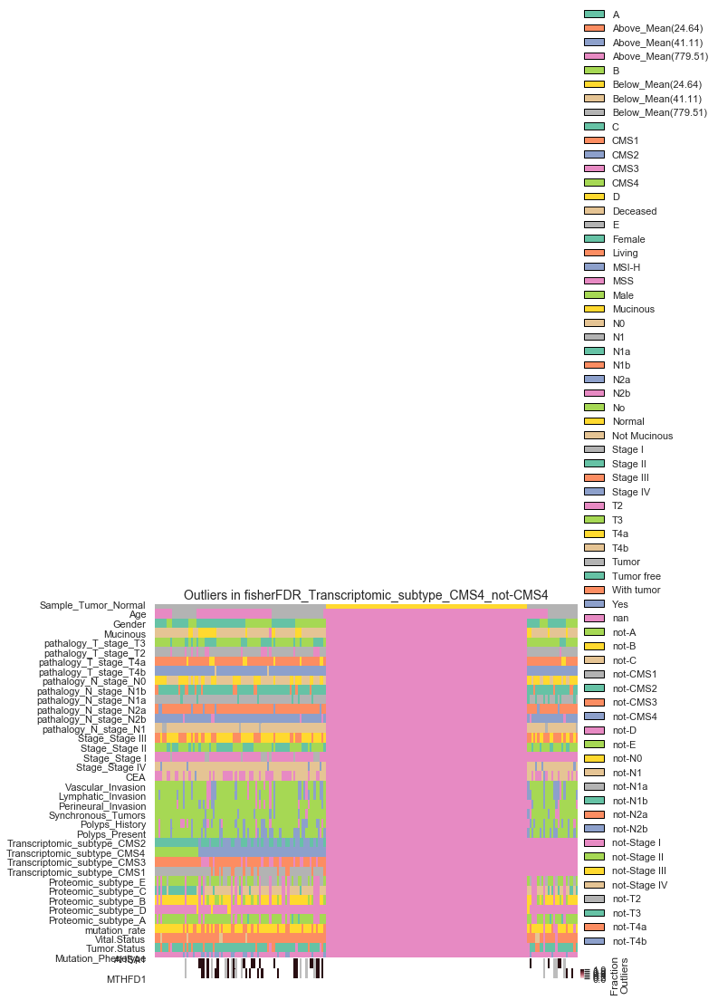

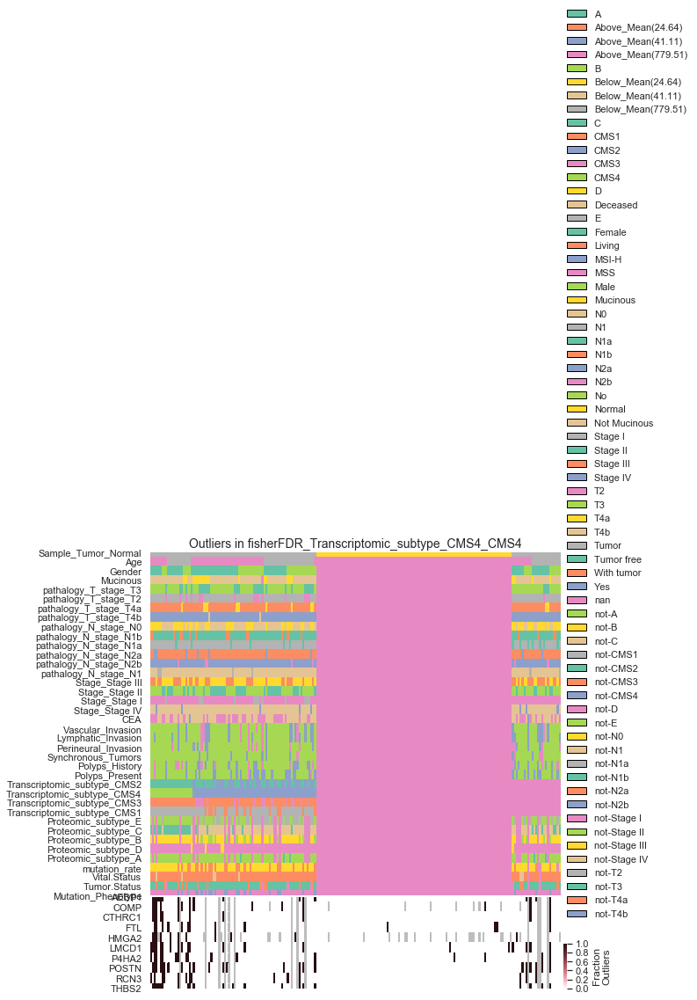

09/10/2019 16:14:55:WARNING:No significant genes at FDR 0.05 in fisherFDR_Transcriptomic_subtype_CMS3_not-CMS3


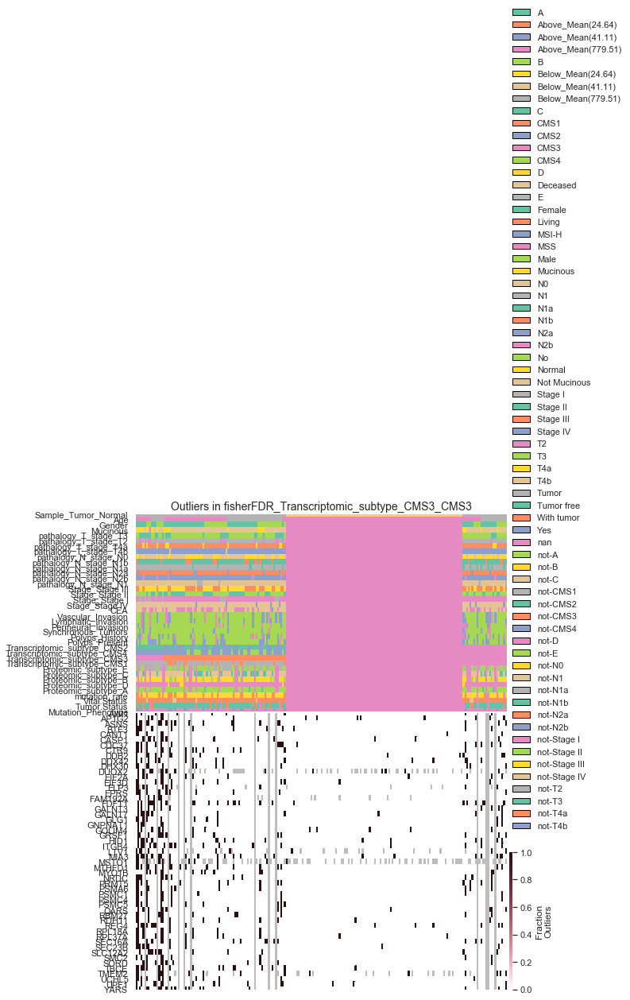

09/10/2019 16:15:10:WARNING:No significant genes at FDR 0.05 in fisherFDR_Transcriptomic_subtype_CMS1_not-CMS1


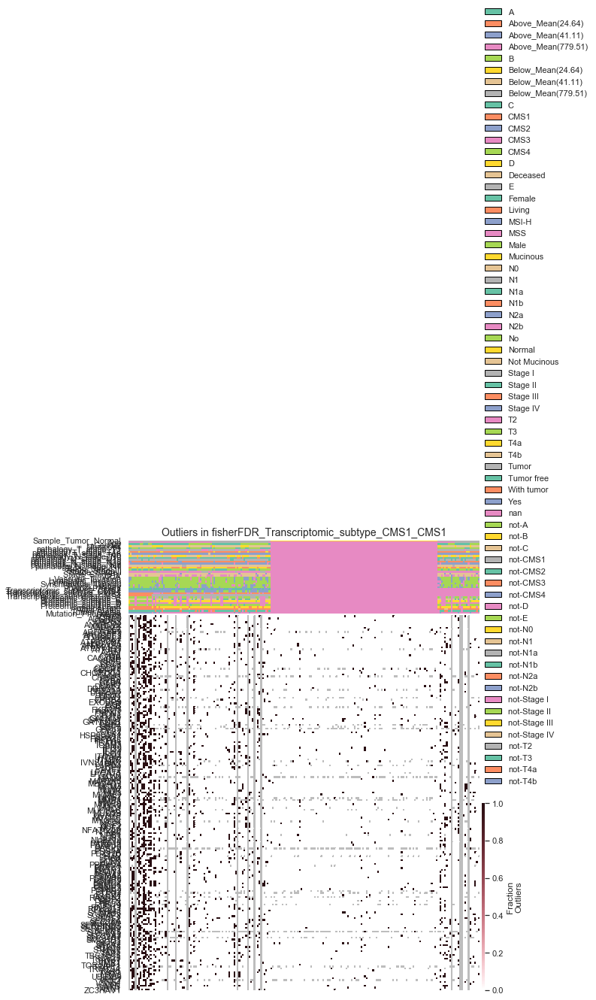

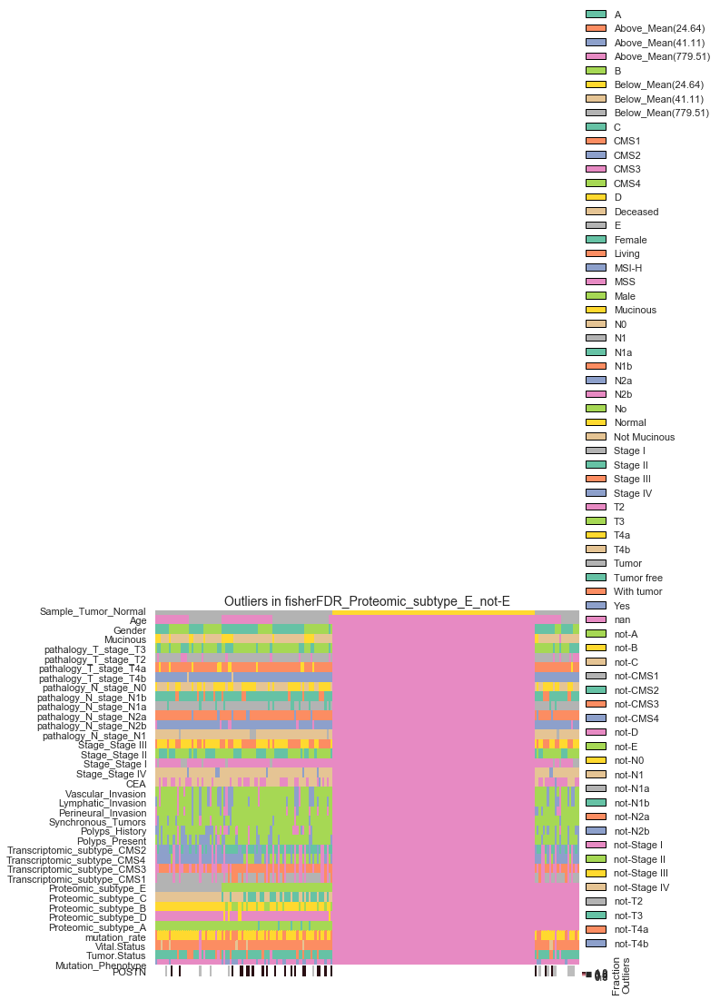

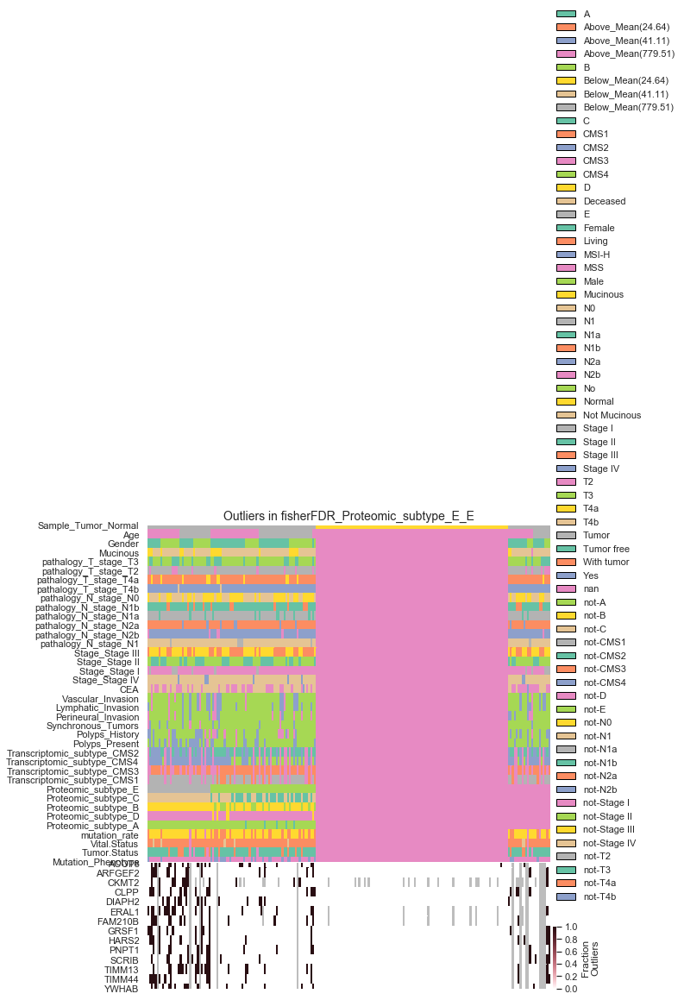

09/10/2019 16:15:35:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_C_not-C
09/10/2019 16:15:35:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_C_C


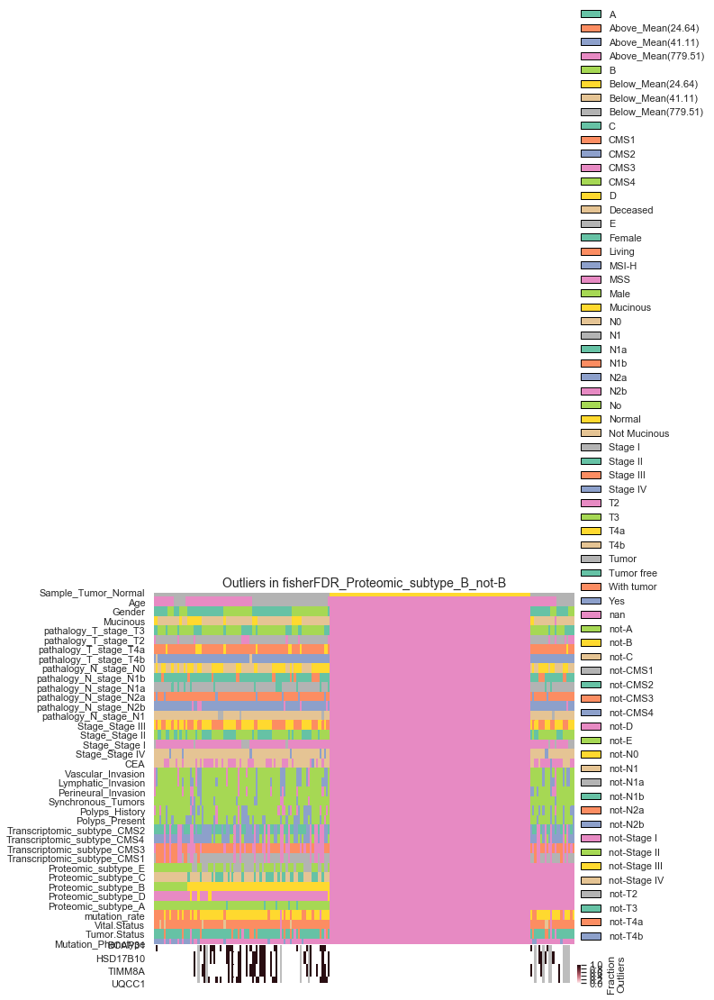

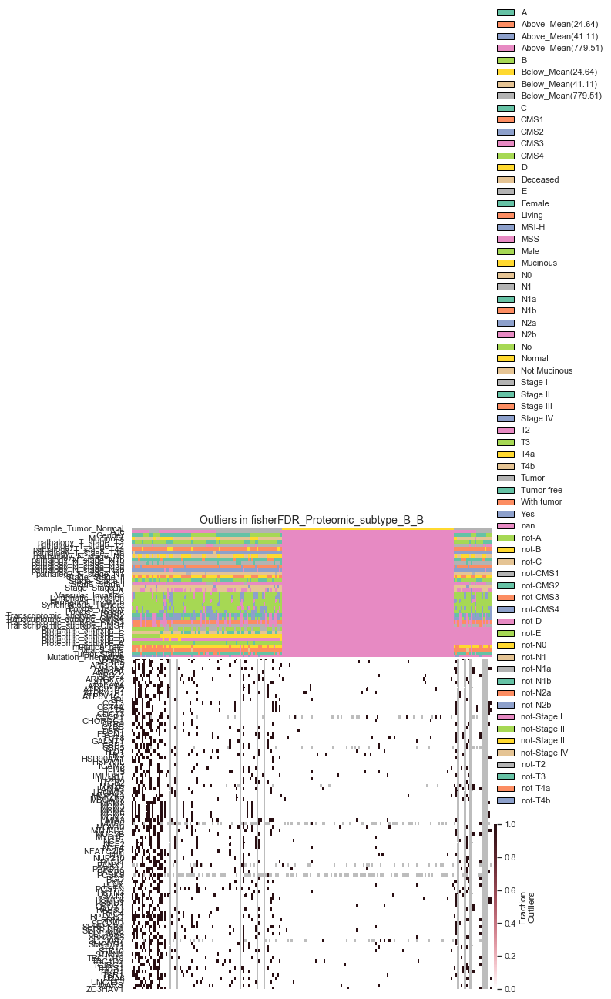

09/10/2019 16:15:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_D_not-D


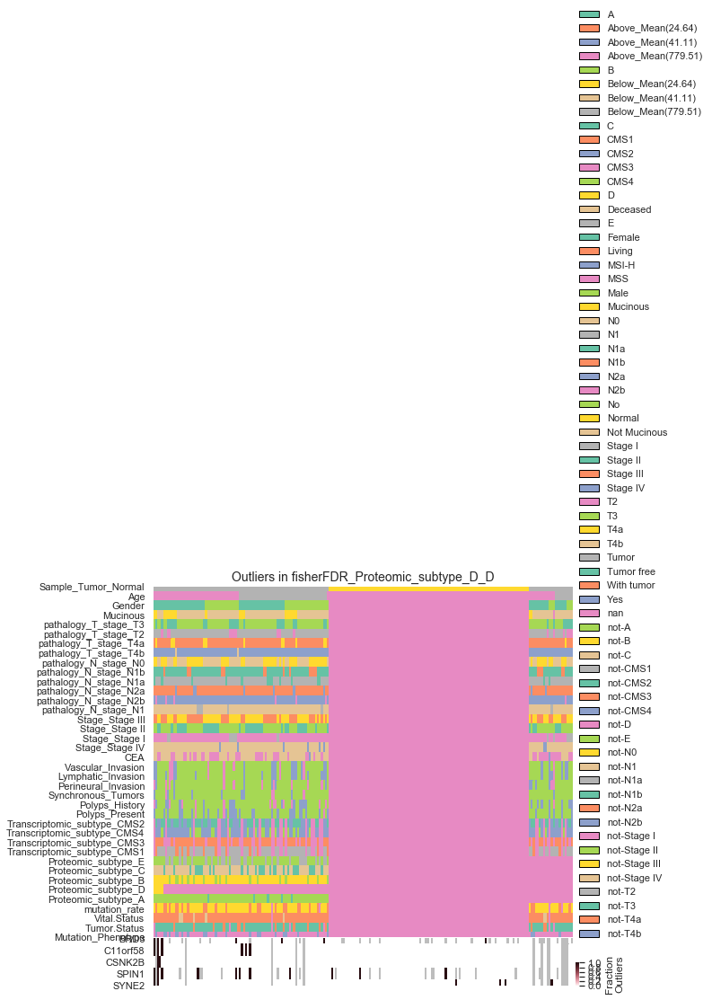

09/10/2019 16:15:51:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_A_not-A
09/10/2019 16:15:51:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_A_A


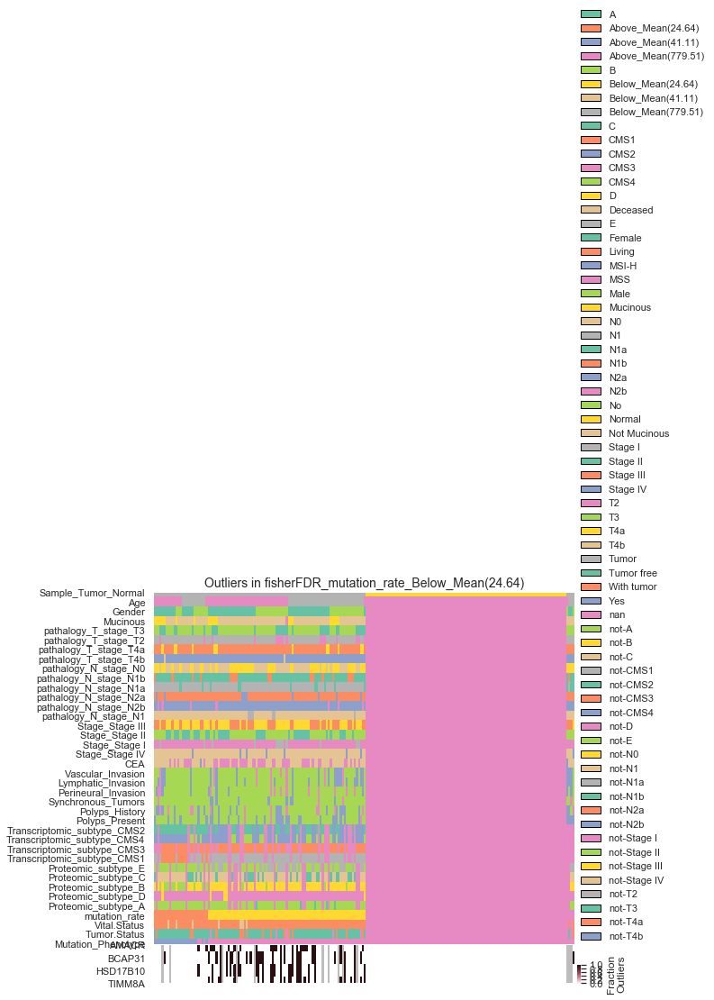

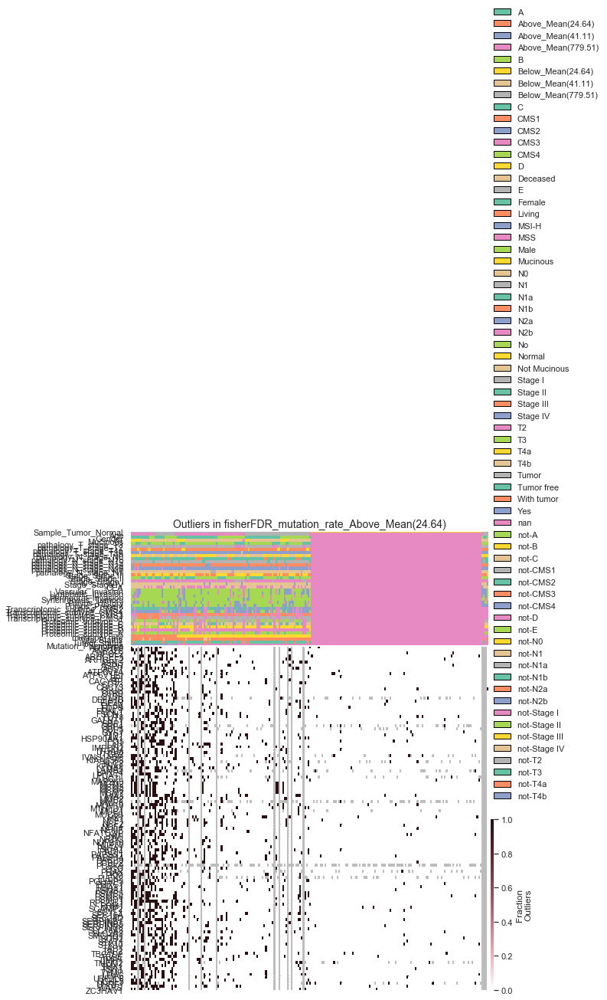

09/10/2019 16:16:01:WARNING:No significant genes at FDR 0.05 in fisherFDR_Vital.Status_Living


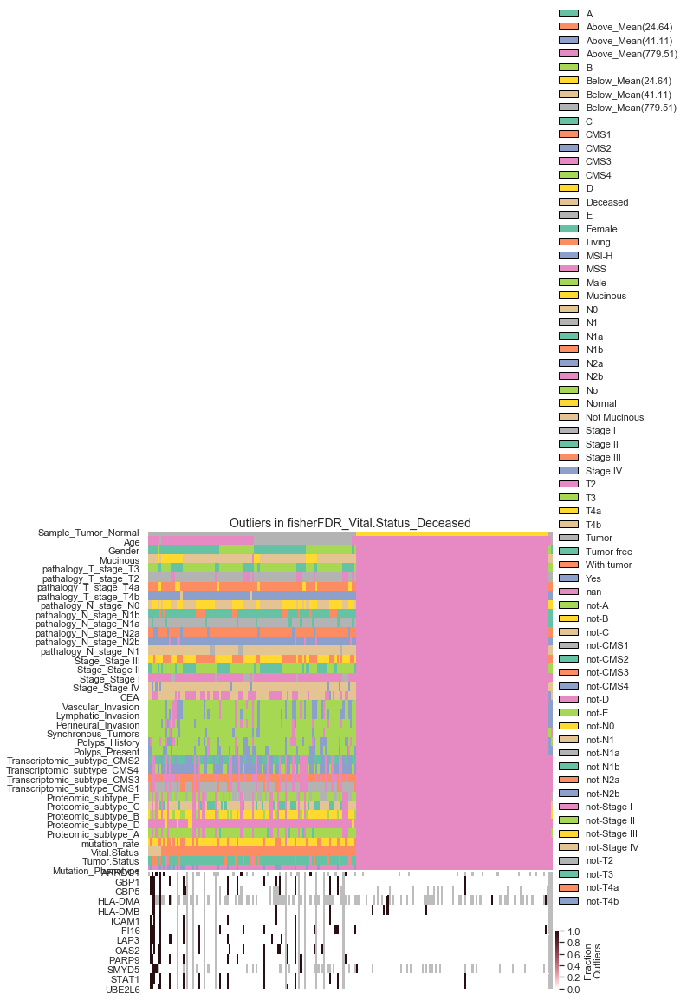

09/10/2019 16:16:05:WARNING:No significant genes at FDR 0.05 in fisherFDR_Tumor.Status_With tumor


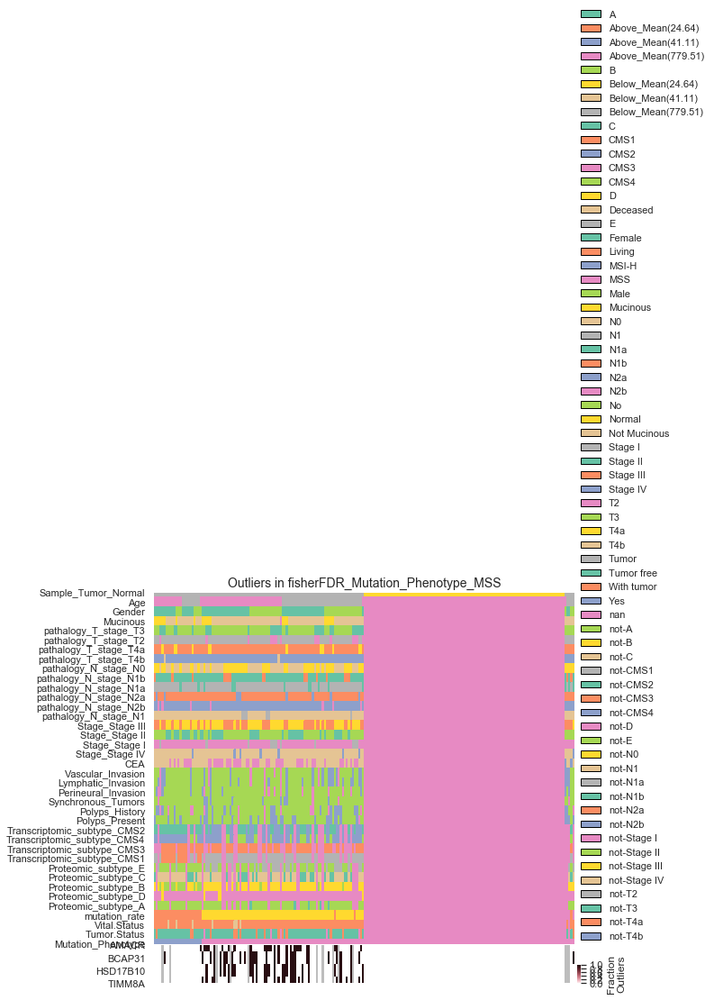

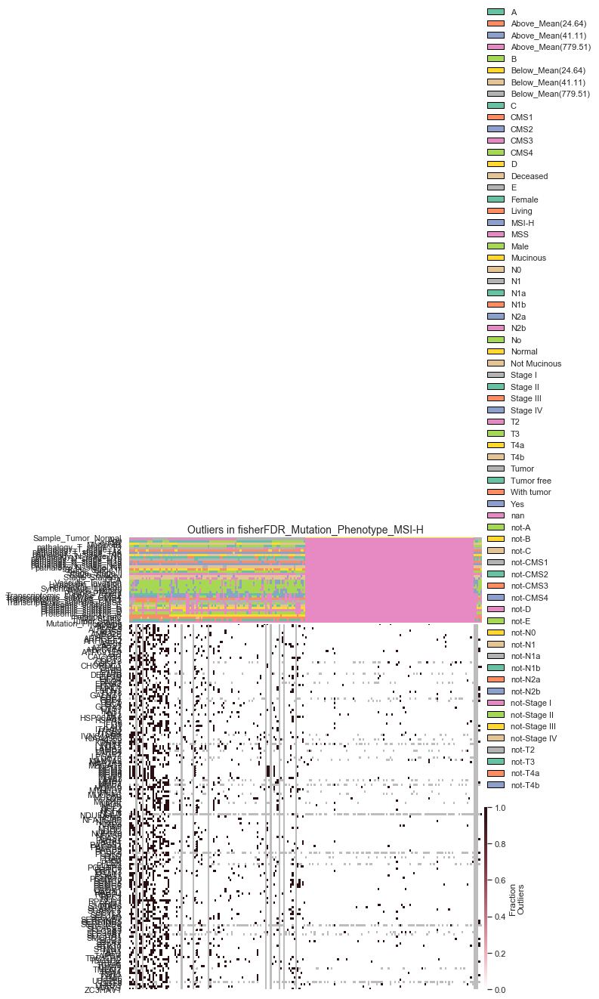

In [18]:
#Deva package visualization
for col in qvalues.df.columns:
    deva.plot_heatmap(
    annotations=annotations,
    qvals=qvalues.df,
    col_of_interest=col,
    vis_table=outliers.frac_table)
    
    plt.show()
    plt.close()

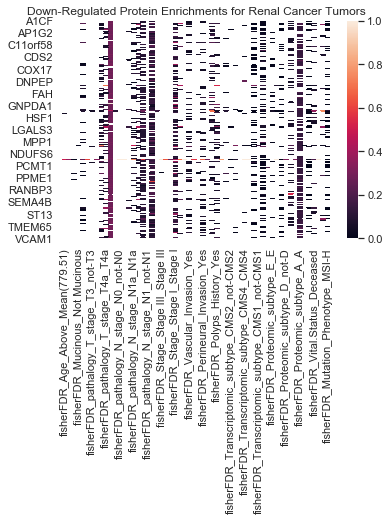

In [19]:
ax2 = plt.axes()
sns.heatmap(results_down, ax = ax2)
ax2.set_title('Down-Regulated Protein Enrichments for Renal Cancer Tumors')
plt.show()

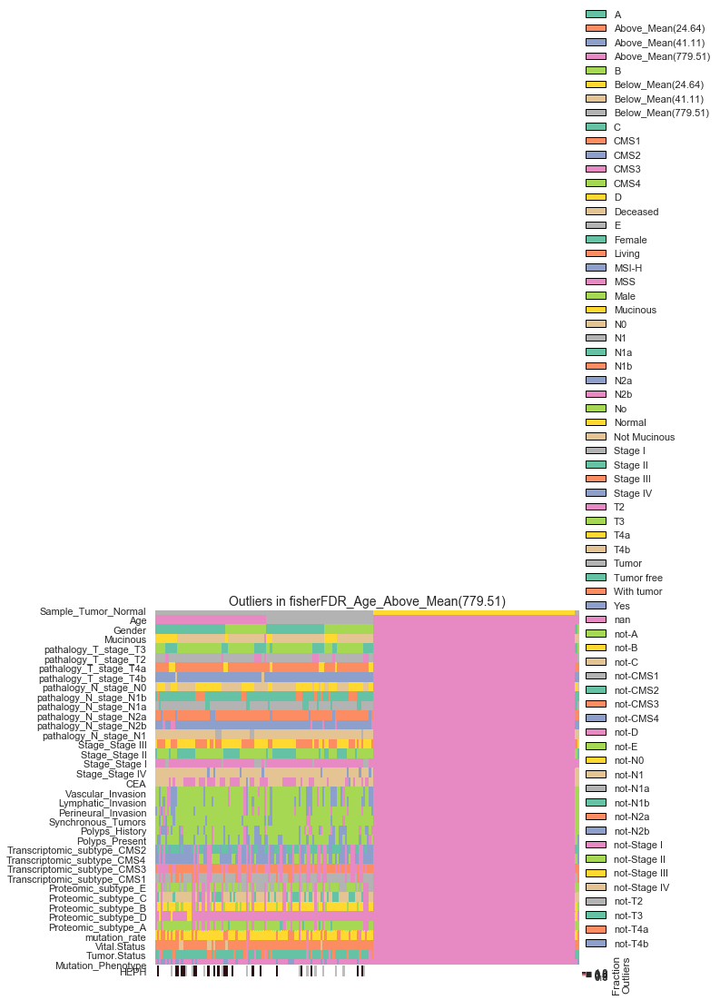

09/10/2019 16:16:25:WARNING:No significant genes at FDR 0.05 in fisherFDR_Gender_Female


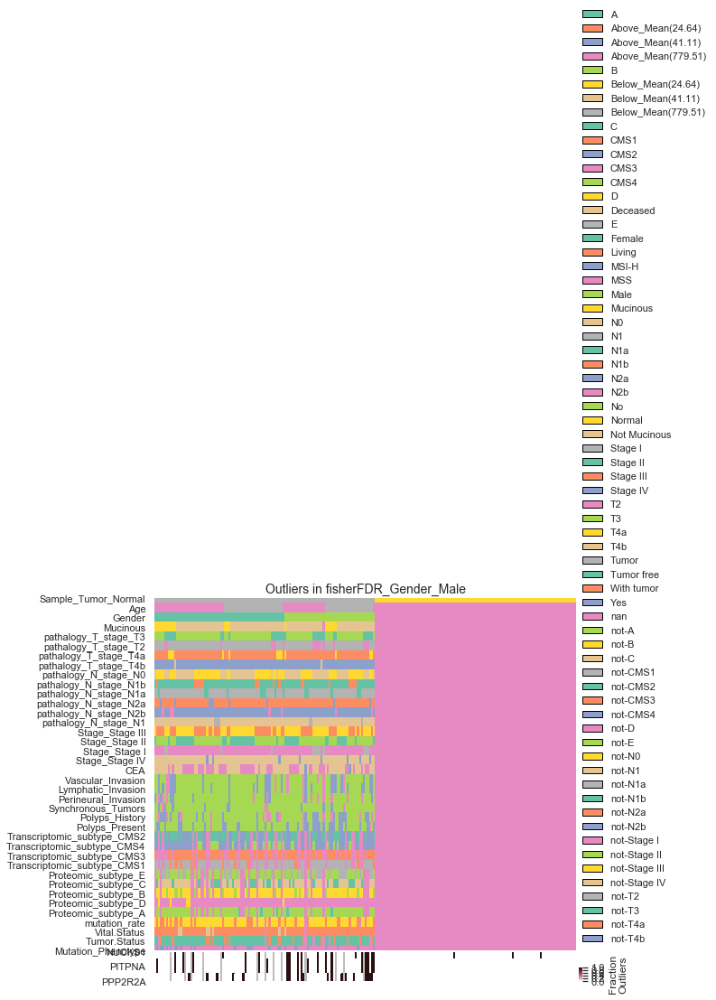

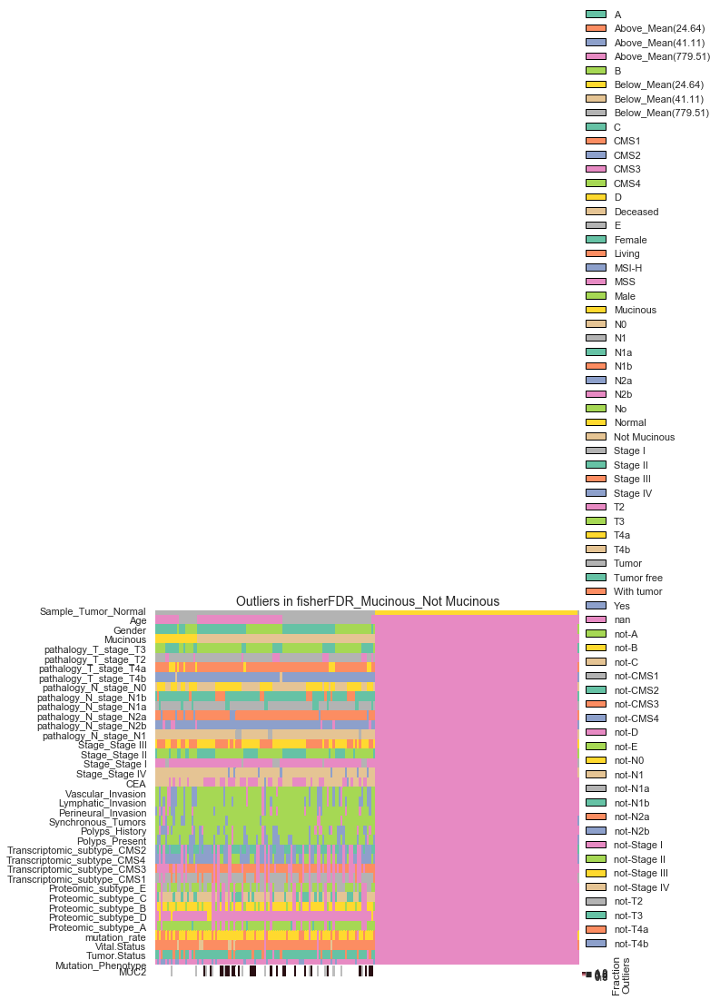

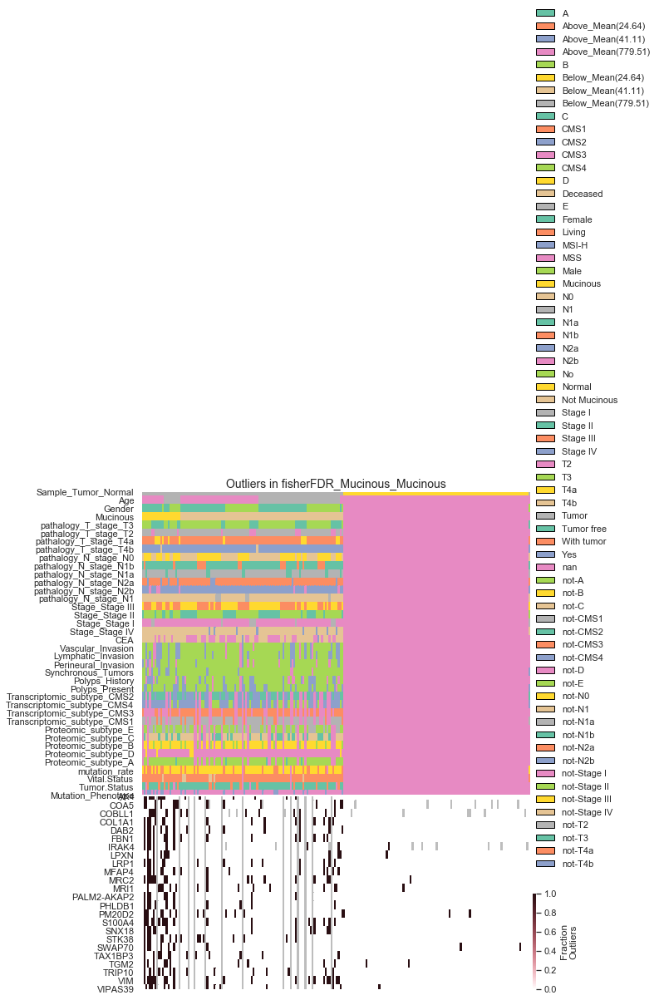

09/10/2019 16:16:41:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T3_T3
09/10/2019 16:16:41:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T3_not-T3
09/10/2019 16:16:41:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T2_not-T2


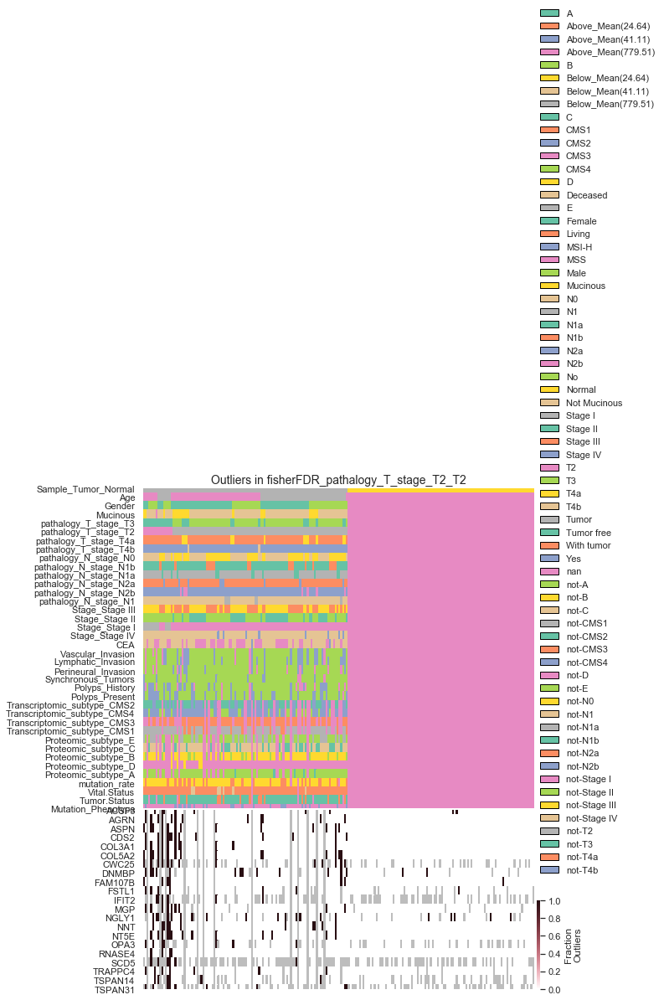

09/10/2019 16:16:46:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T4a_T4a
09/10/2019 16:16:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_T_stage_T4b_T4b
09/10/2019 16:16:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N0_N0
09/10/2019 16:16:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N0_not-N0
09/10/2019 16:16:47:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N1b_not-N1b


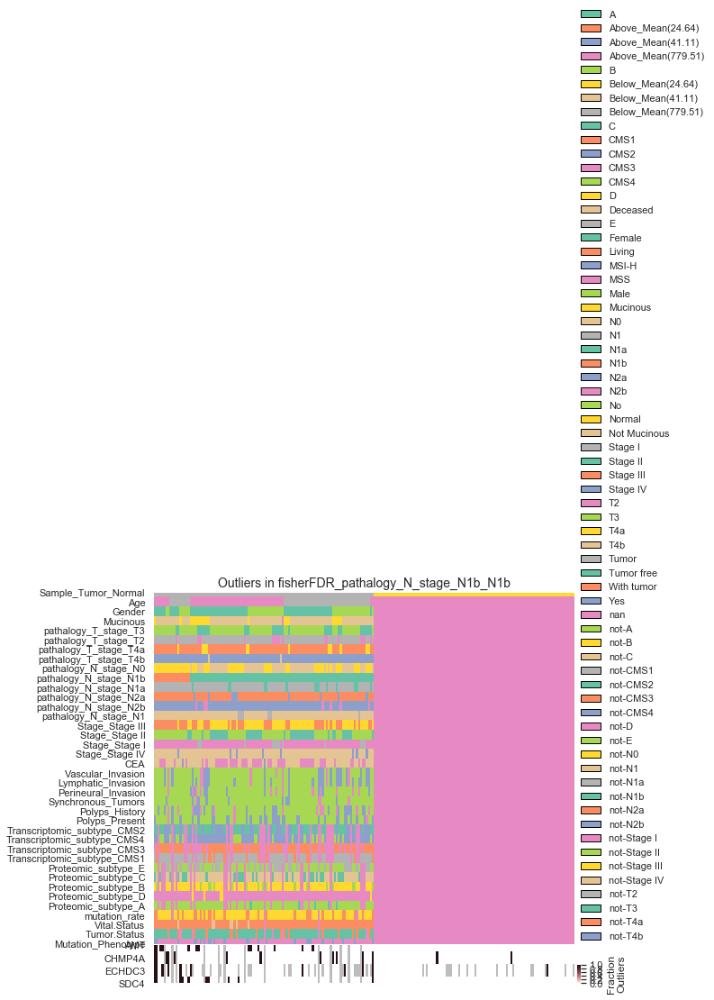

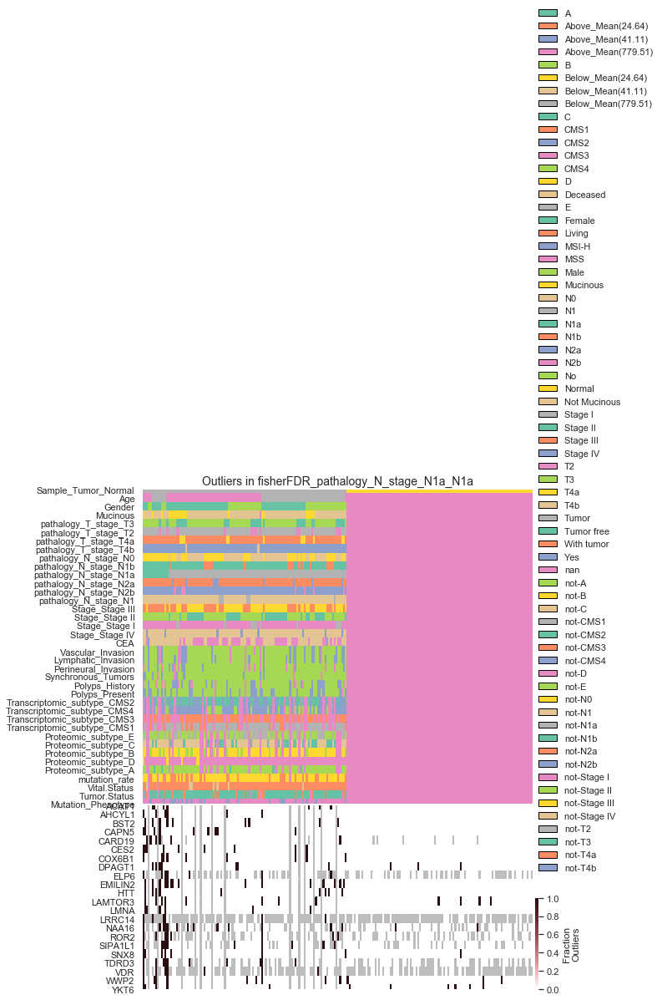

09/10/2019 16:16:57:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N2a_N2a


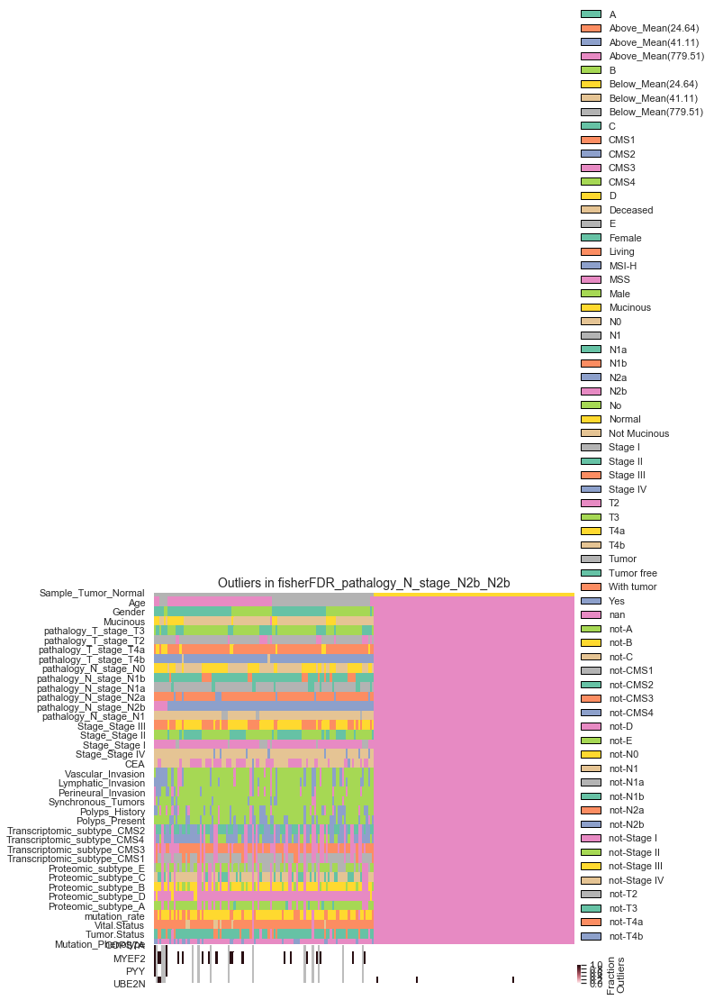

09/10/2019 16:17:02:WARNING:No significant genes at FDR 0.05 in fisherFDR_pathalogy_N_stage_N1_not-N1


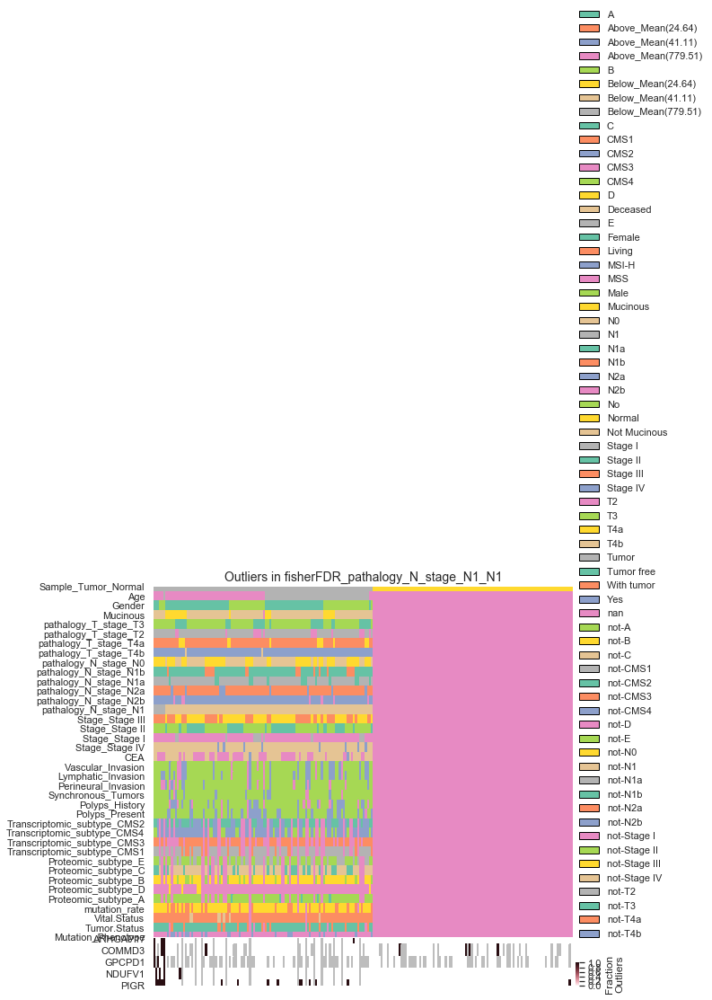

09/10/2019 16:17:08:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_Stage III_not-Stage III


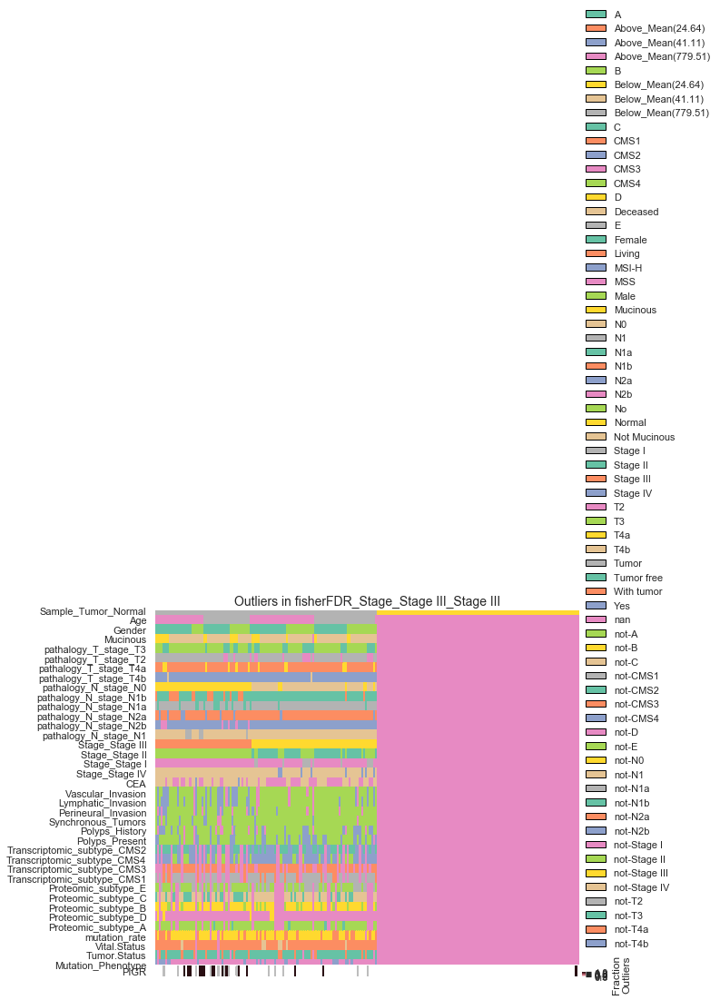

09/10/2019 16:17:11:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_Stage II_Stage II
09/10/2019 16:17:11:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_Stage I_not-Stage I
09/10/2019 16:17:11:WARNING:No significant genes at FDR 0.05 in fisherFDR_Stage_Stage I_Stage I


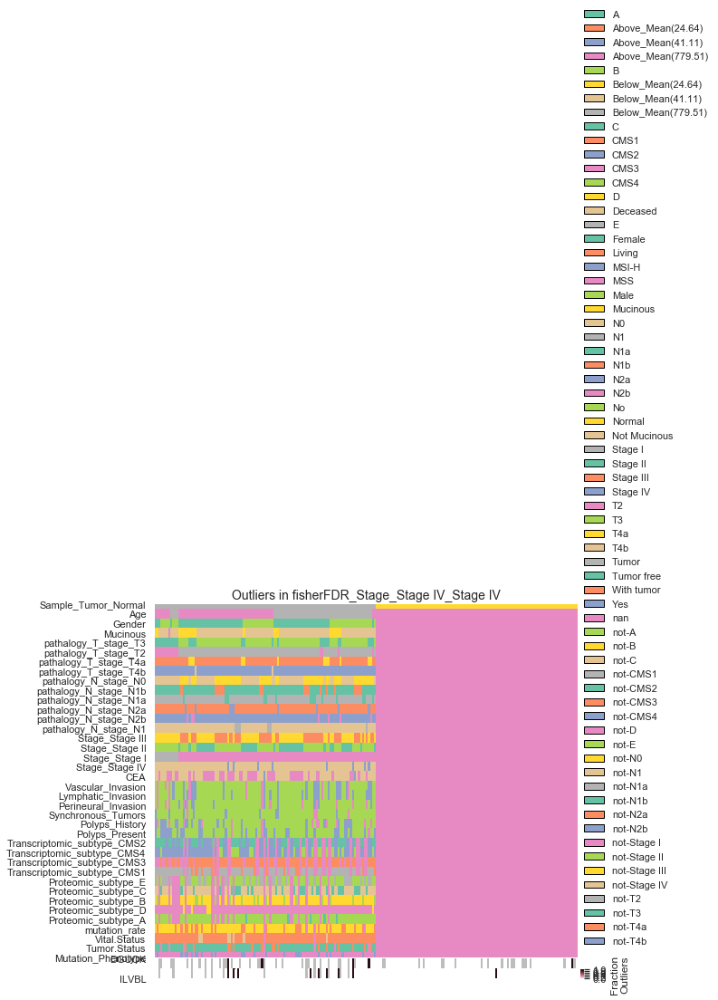

09/10/2019 16:17:15:WARNING:No significant genes at FDR 0.05 in fisherFDR_Vascular_Invasion_No


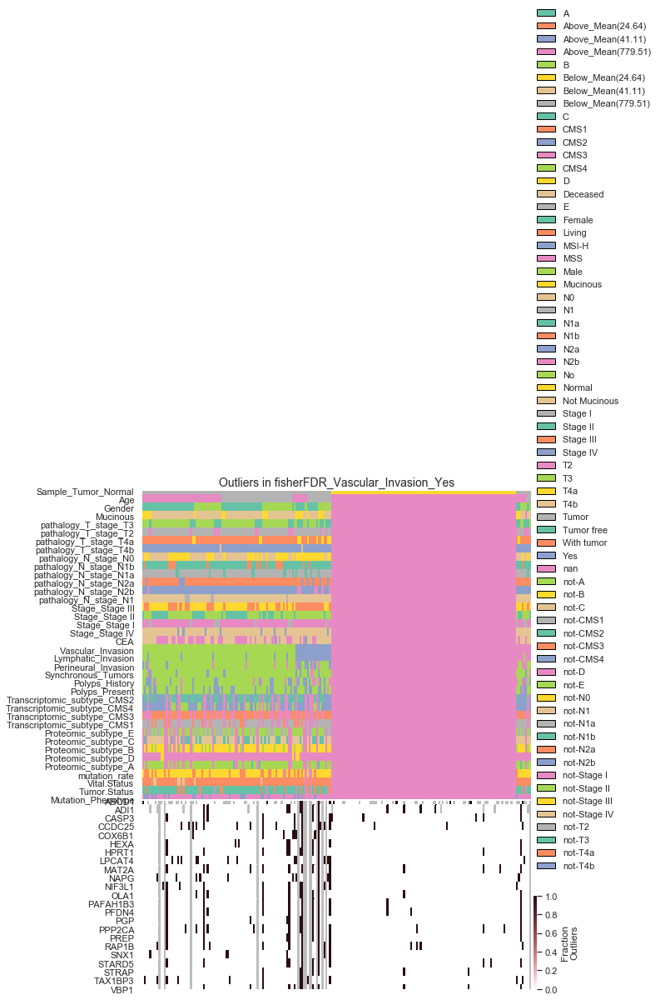

09/10/2019 16:17:20:WARNING:No significant genes at FDR 0.05 in fisherFDR_Lymphatic_Invasion_No


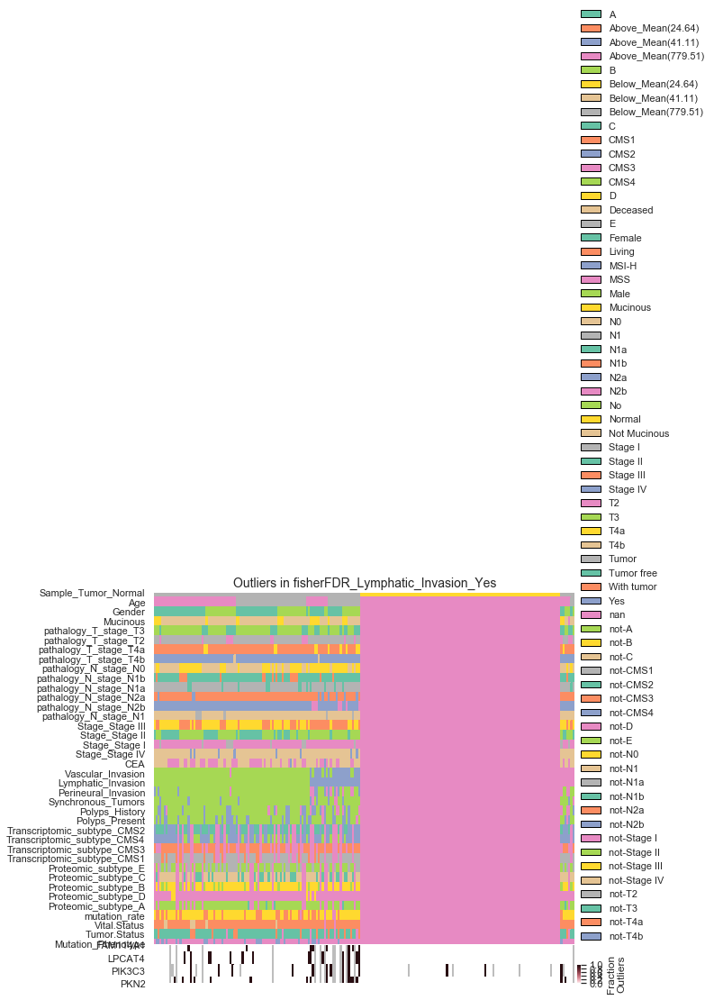

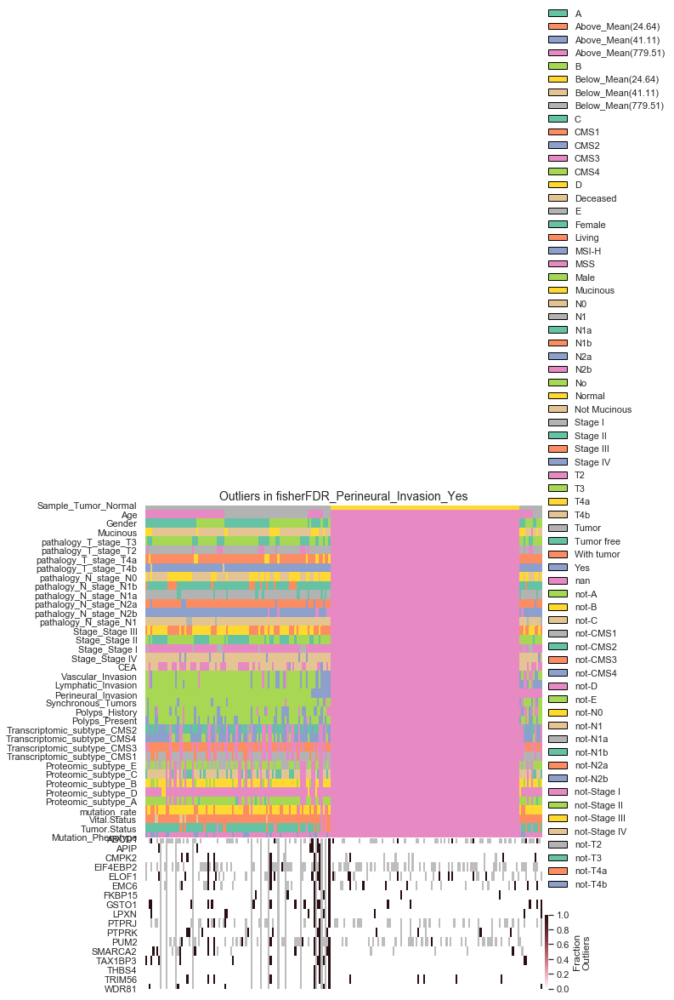

09/10/2019 16:17:30:WARNING:No significant genes at FDR 0.05 in fisherFDR_Synchronous_Tumors_No


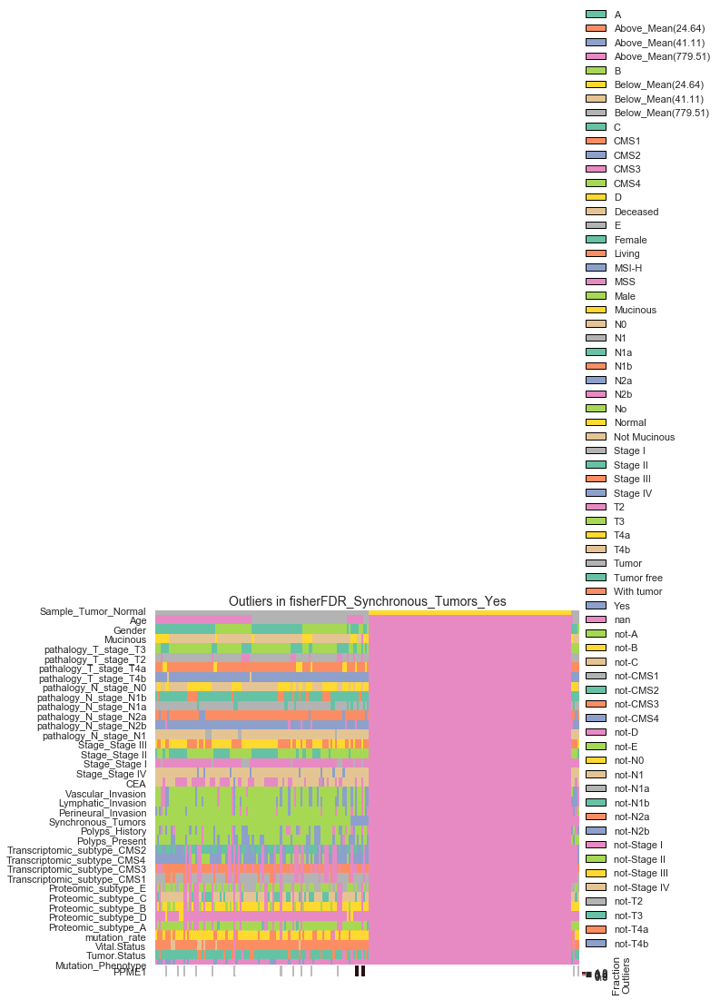

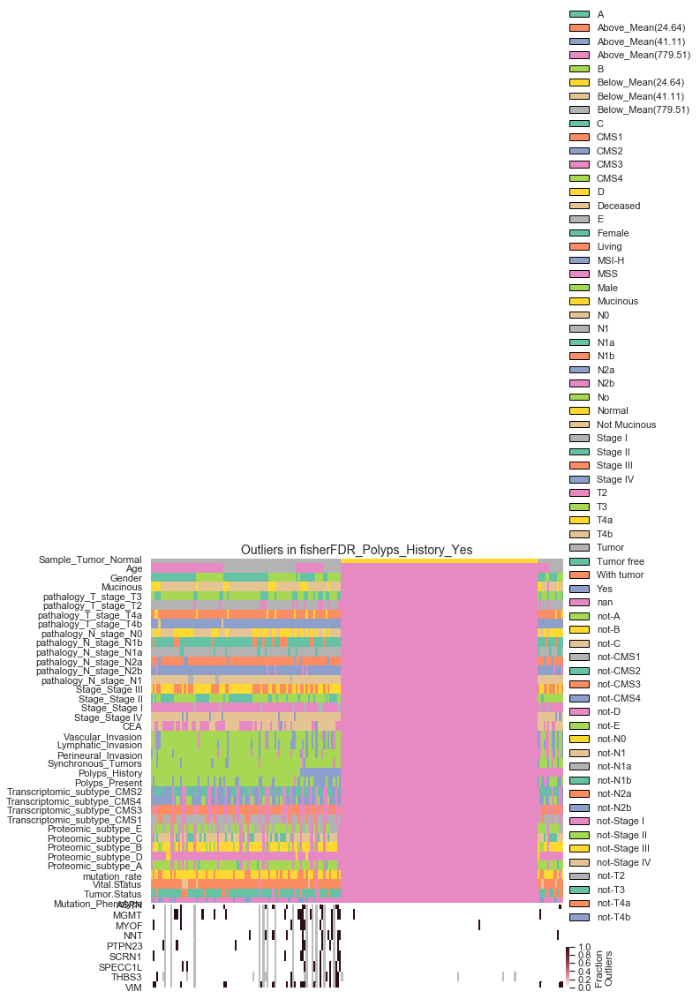

09/10/2019 16:17:40:WARNING:No significant genes at FDR 0.05 in fisherFDR_Polyps_Present_No


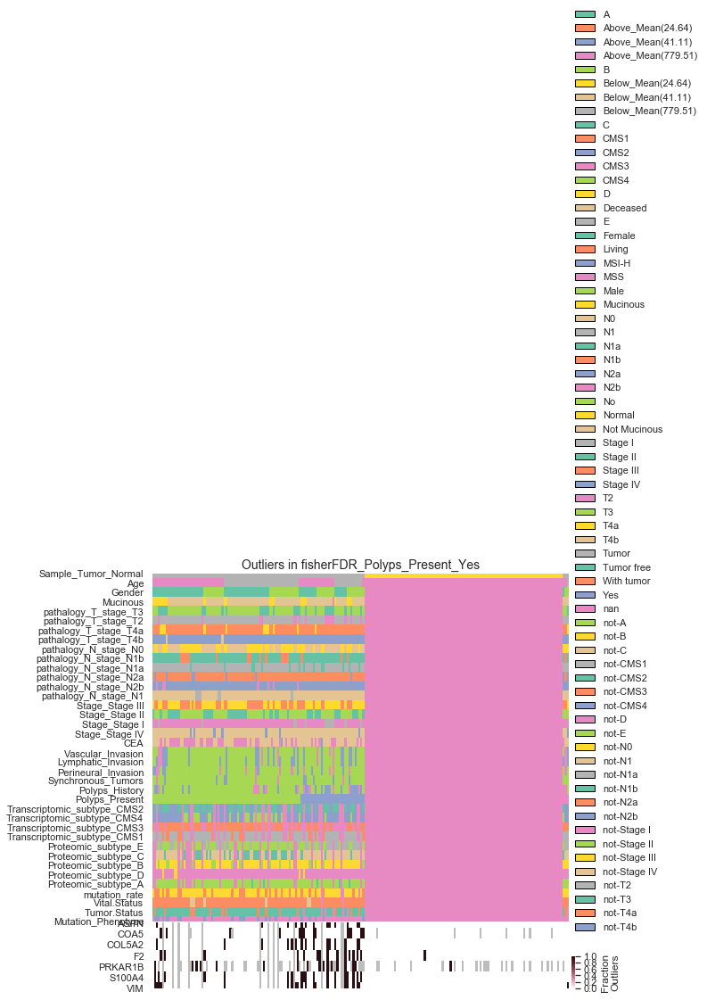

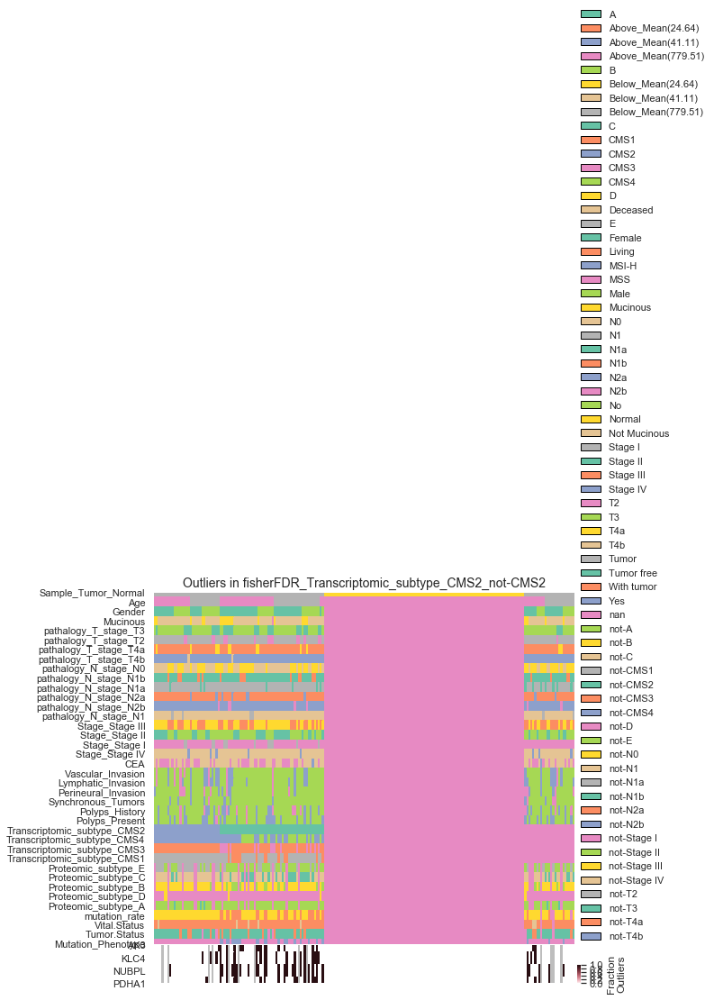

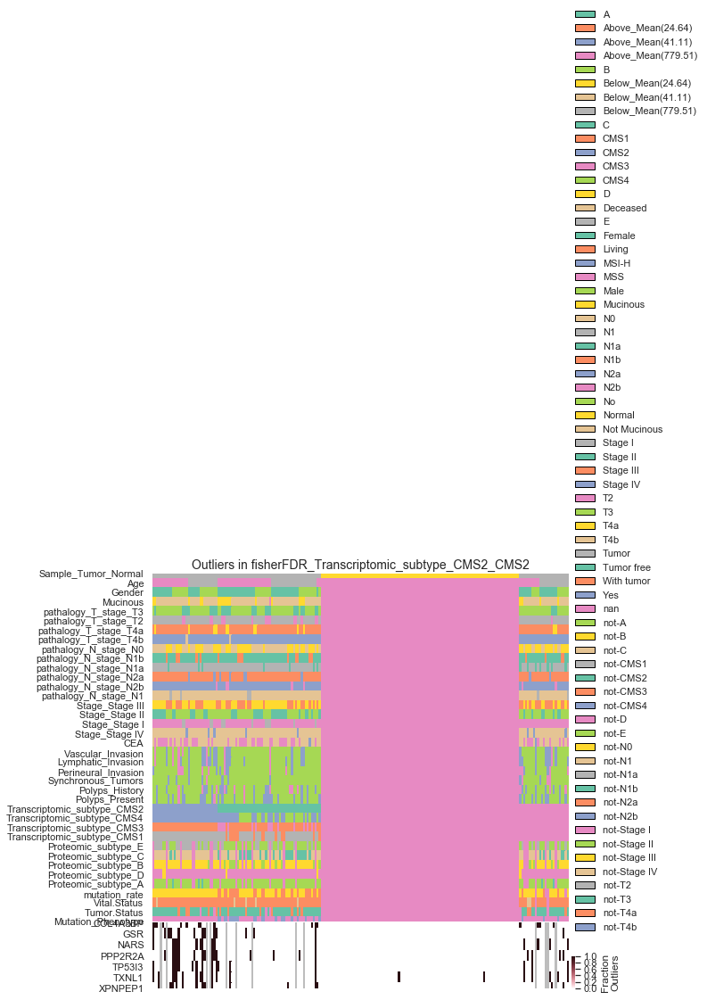

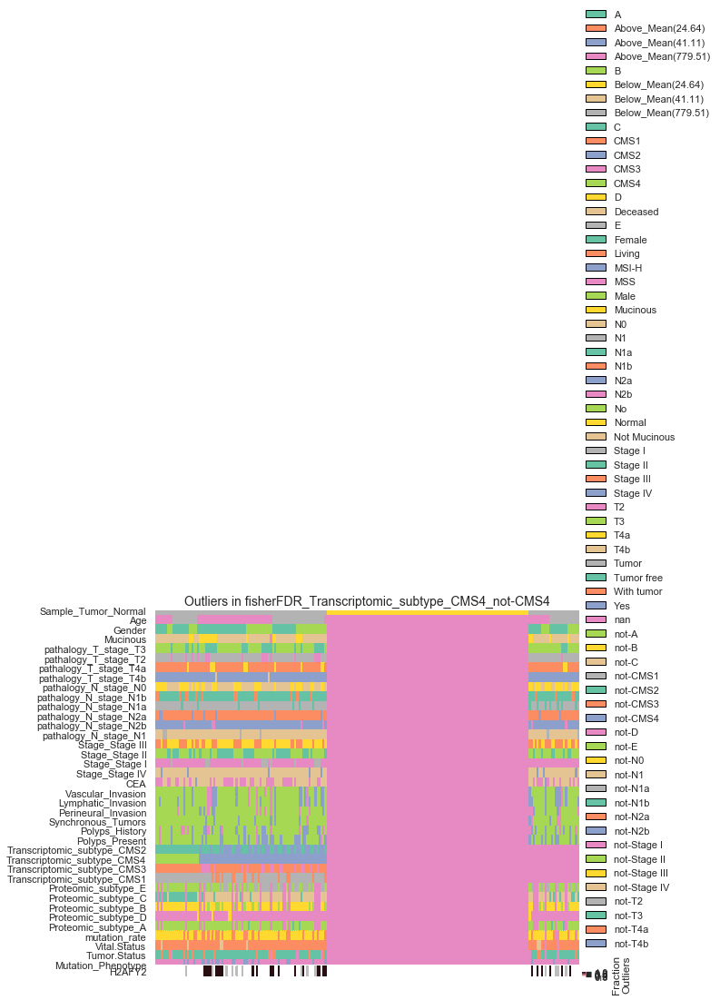

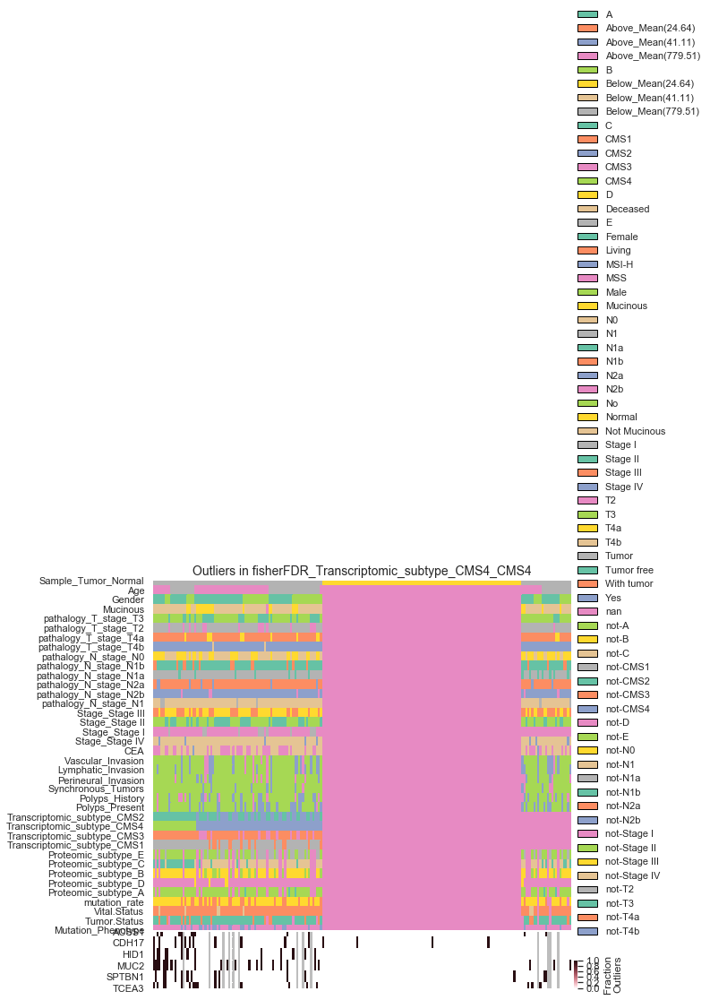

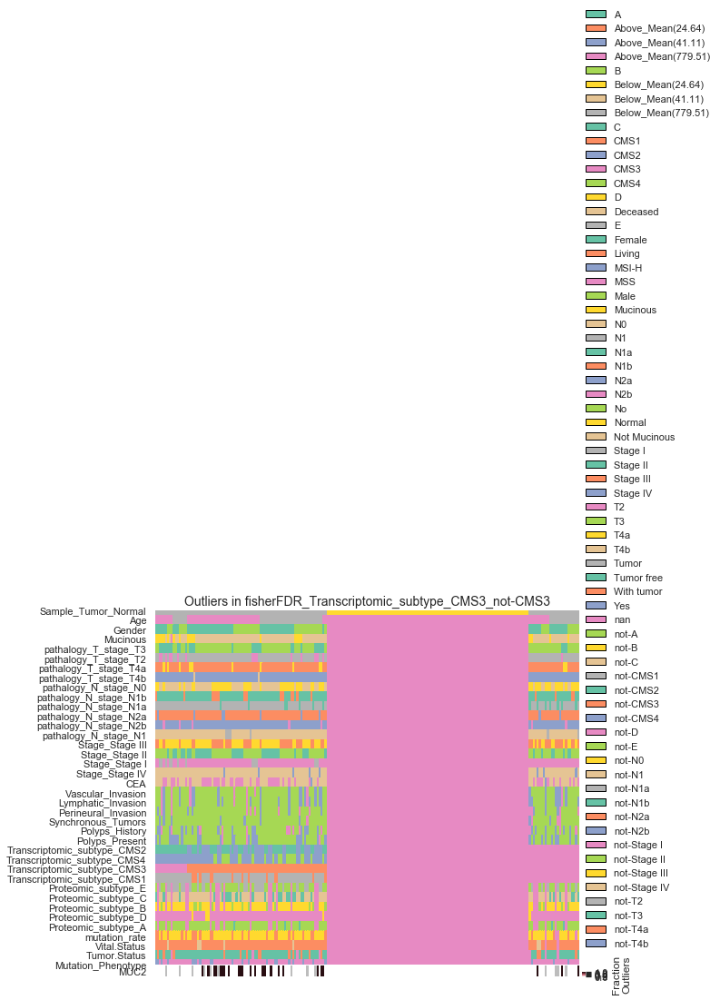

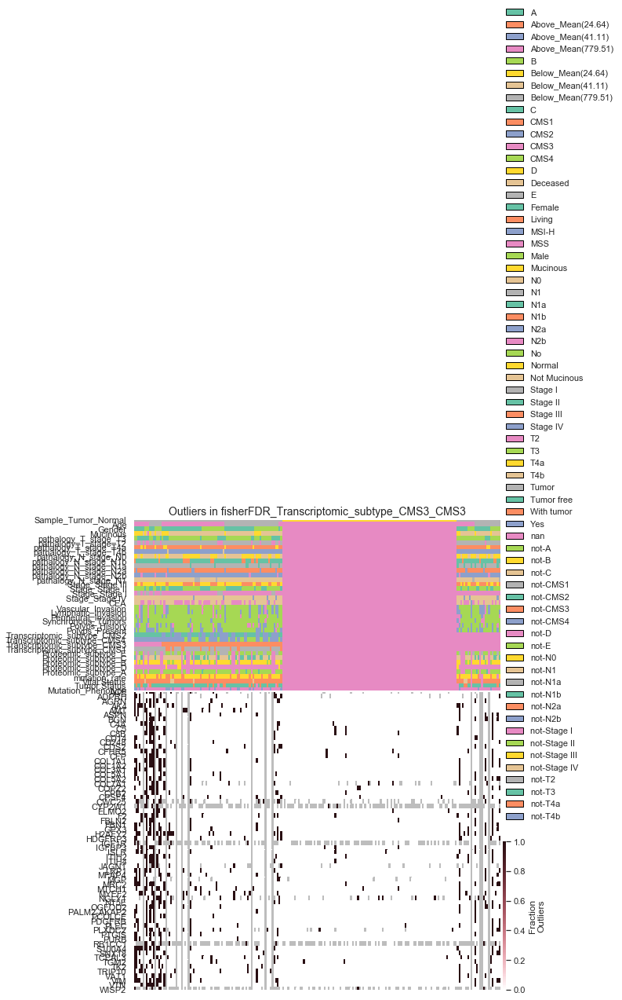

09/10/2019 16:18:13:WARNING:No significant genes at FDR 0.05 in fisherFDR_Transcriptomic_subtype_CMS1_not-CMS1


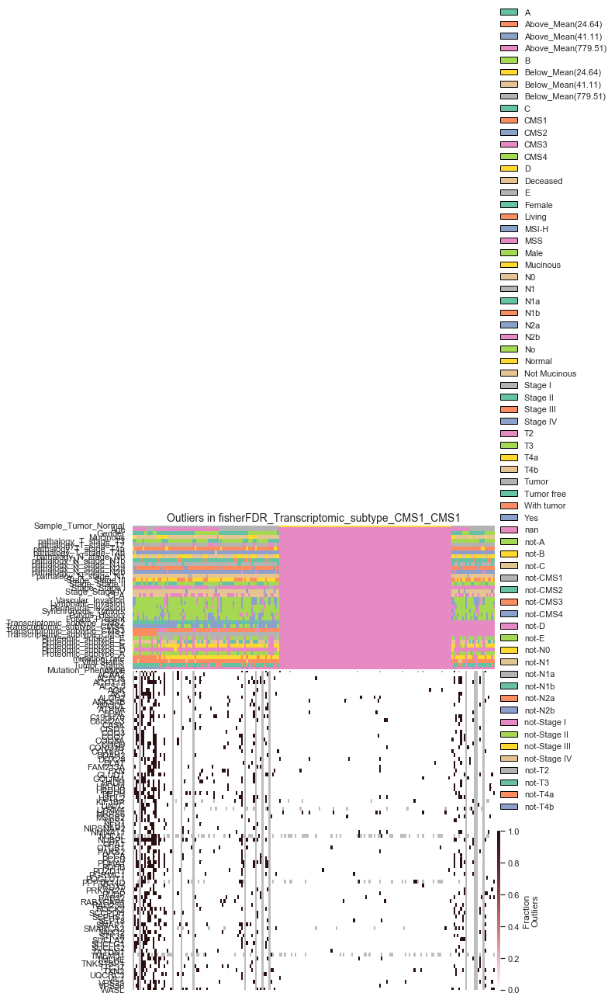

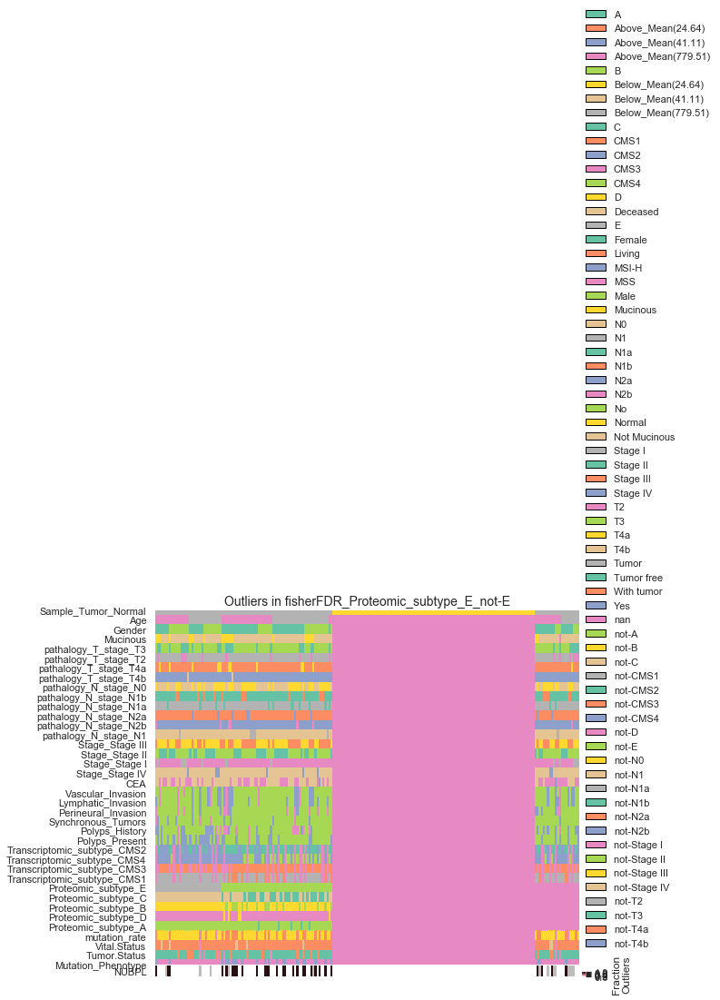

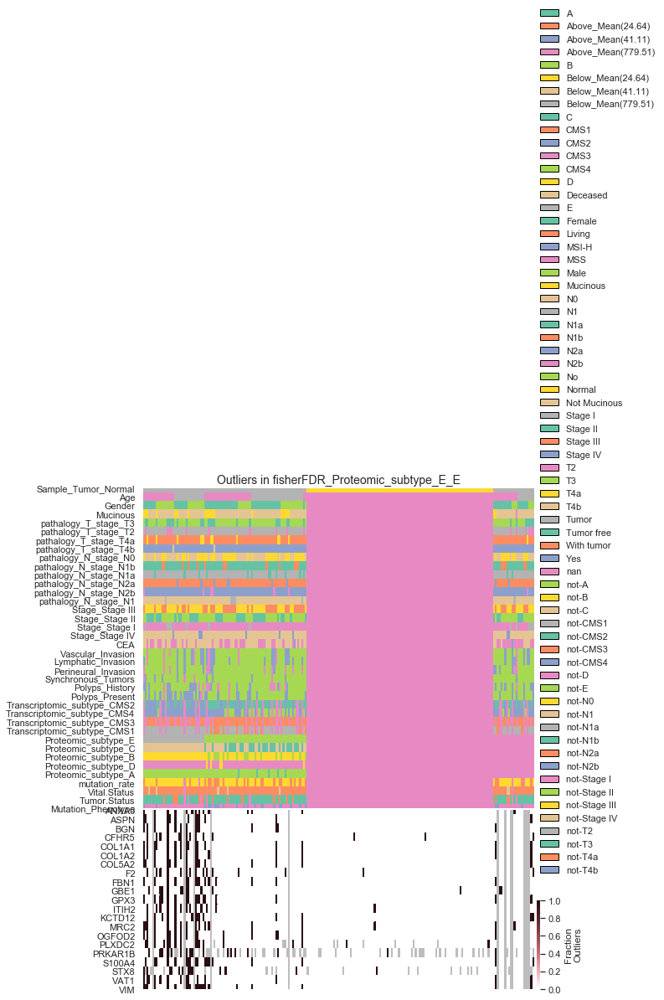

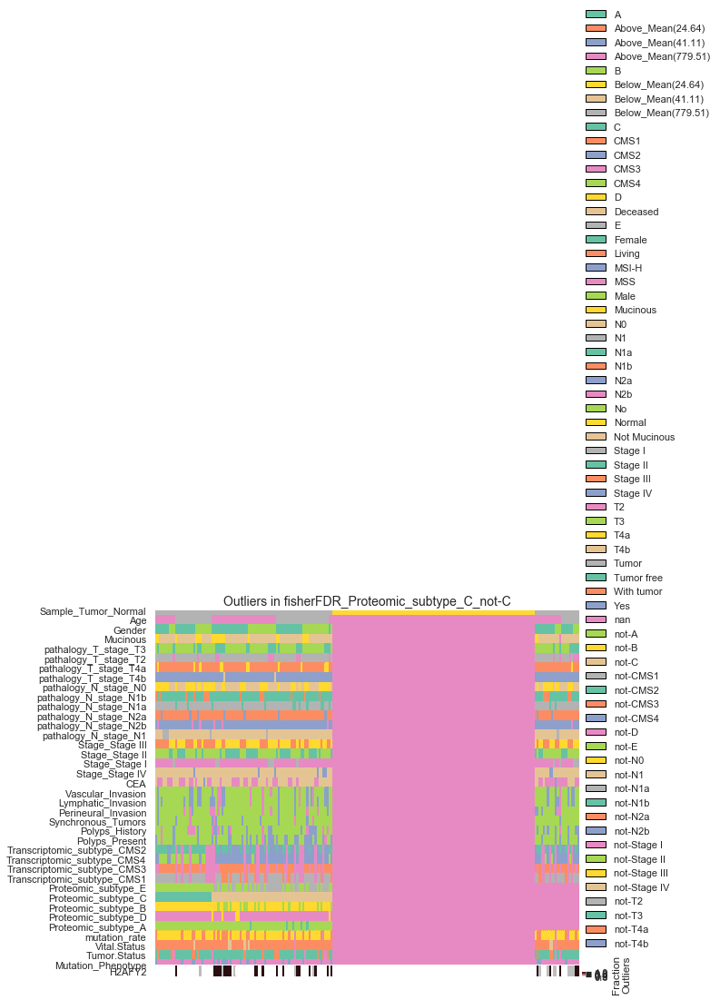

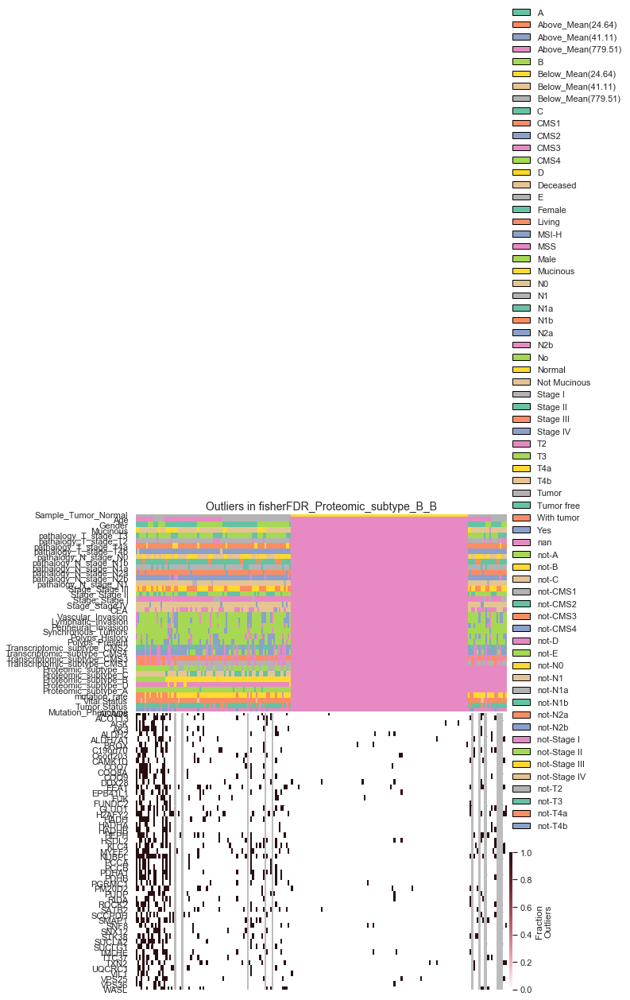

09/10/2019 16:18:36:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_D_not-D
09/10/2019 16:18:36:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_D_D
09/10/2019 16:18:36:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_A_not-A
09/10/2019 16:18:36:WARNING:No significant genes at FDR 0.05 in fisherFDR_Proteomic_subtype_A_A


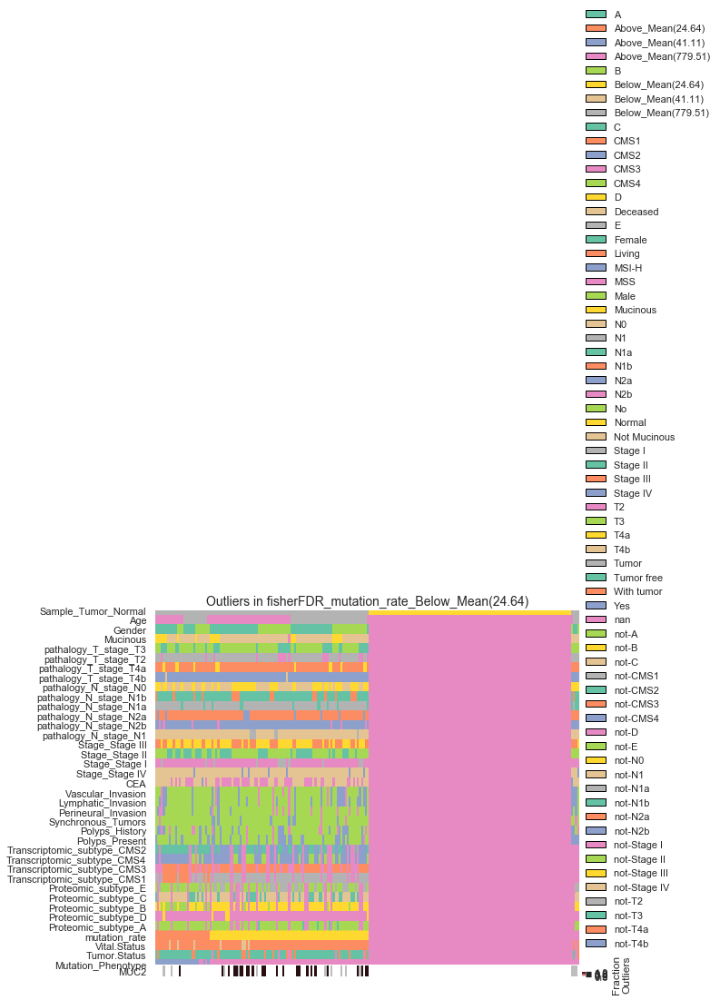

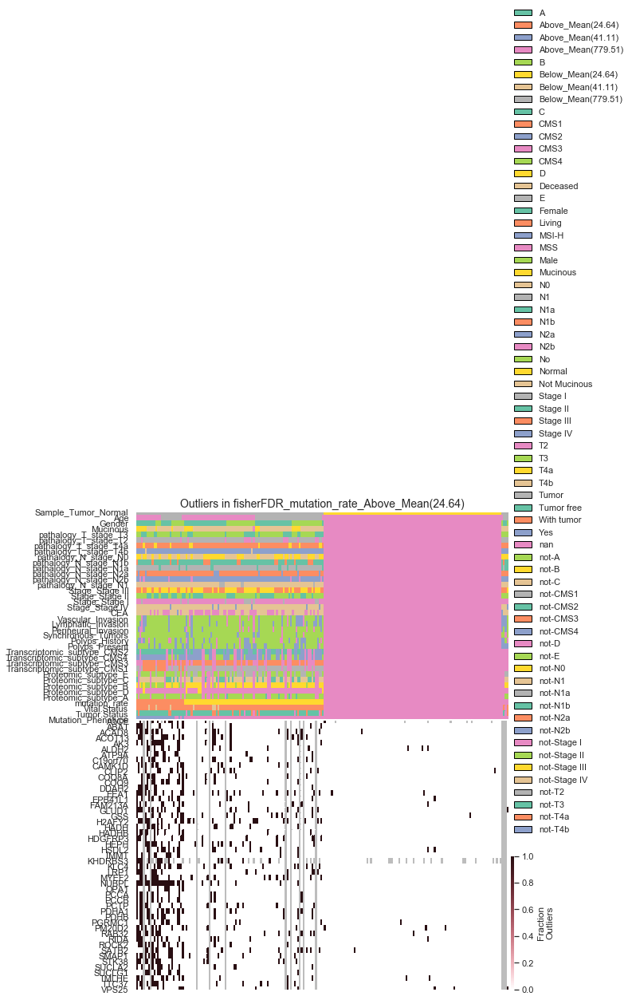

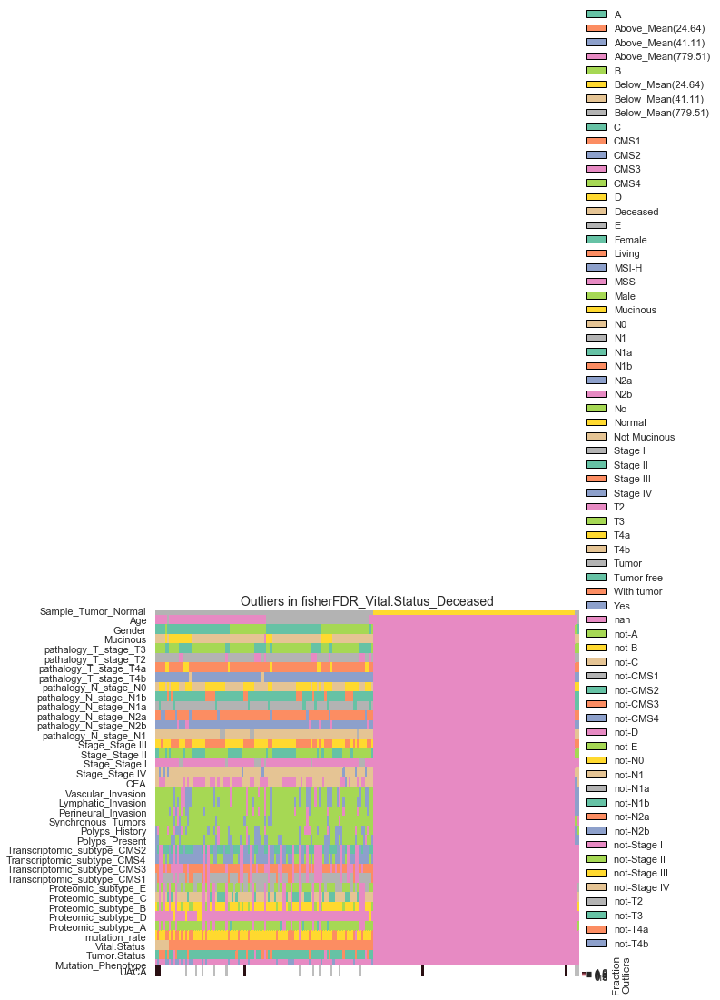

09/10/2019 16:18:51:WARNING:No significant genes at FDR 0.05 in fisherFDR_Tumor.Status_Tumor free


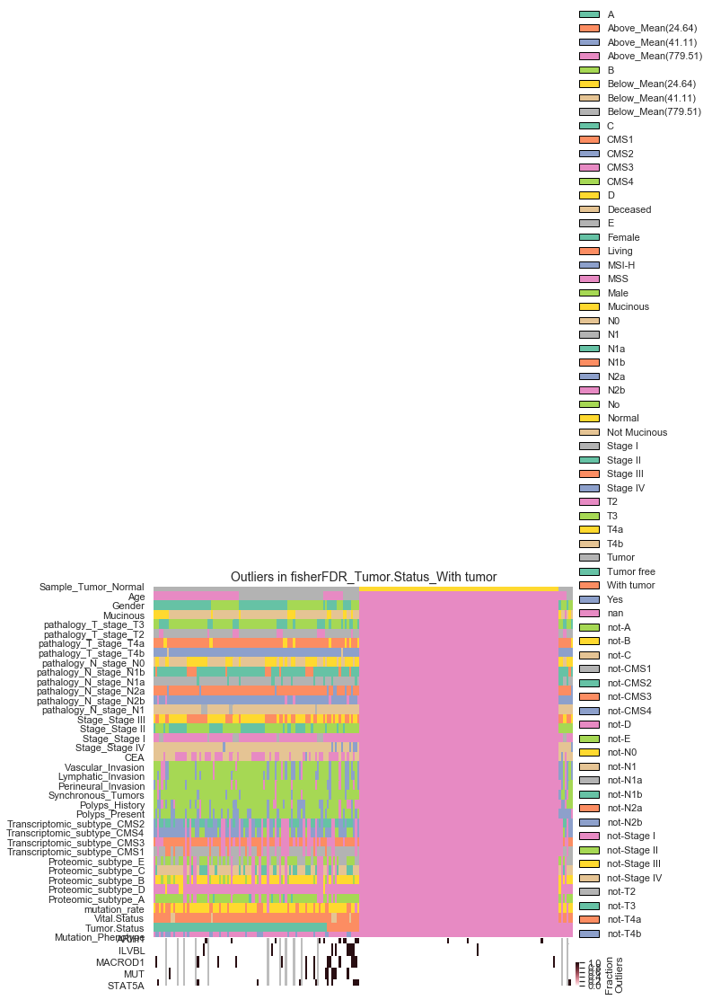

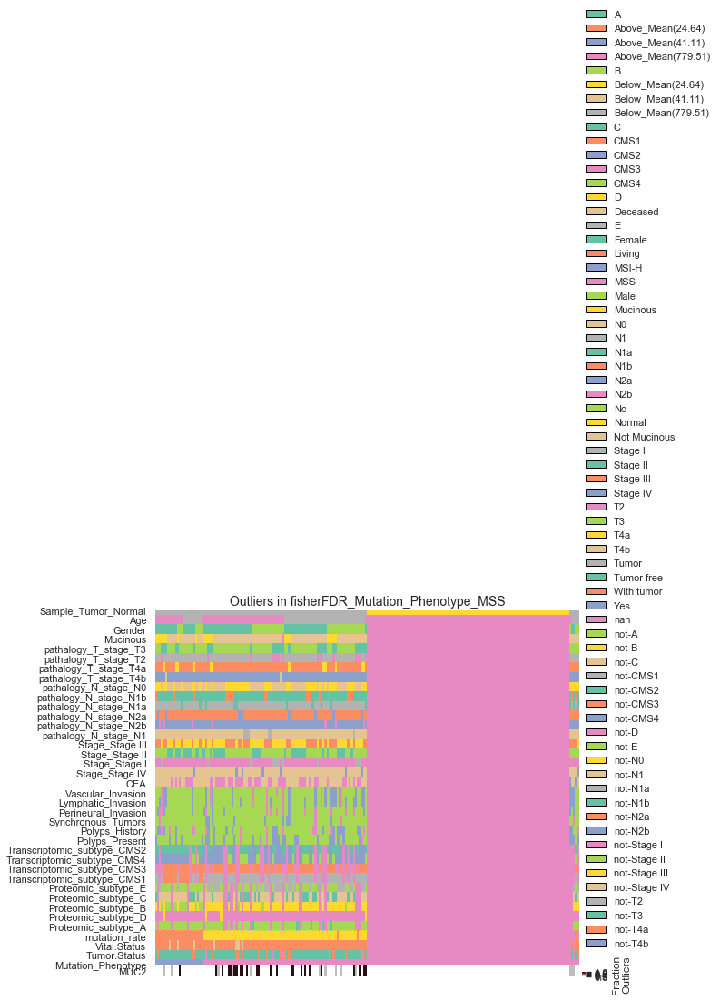

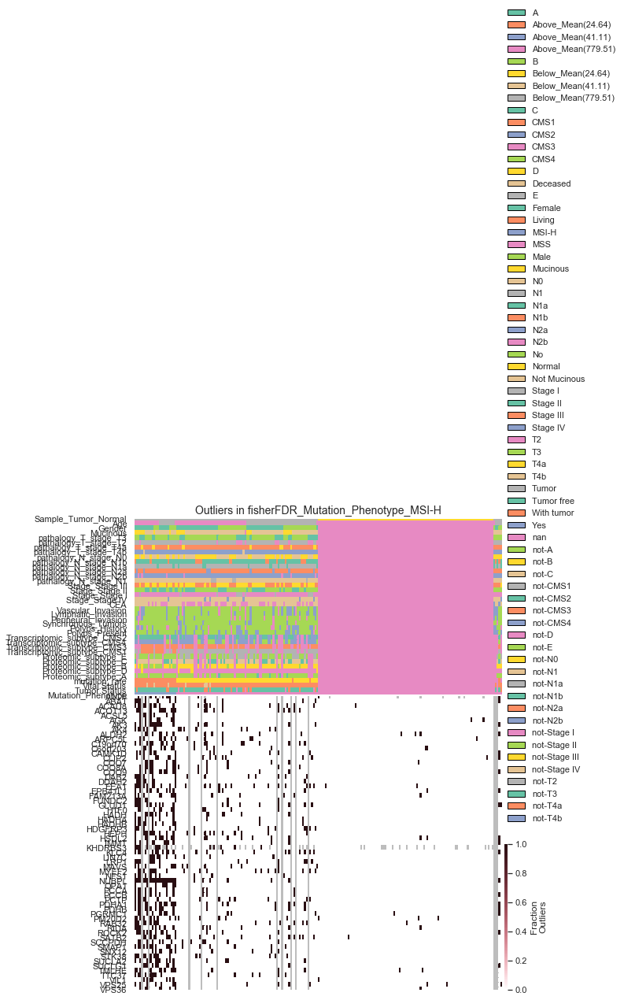

In [20]:
#Deva package visualization
for col in qvalues_down.df.columns:
    deva.plot_heatmap(
    annotations=annotations,
    qvals=qvalues_down.df,
    col_of_interest=col,
    vis_table=outliers_down.frac_table)
    
    plt.show()
    plt.close()

## Step 5: Perform Gene Set Enrichment Analysis

Part A: Up-regulated Genes

In [22]:
gsea_up = {}
for col in sig_cols_up:
    col_name = col.columns[0]
    col_name = "_".join(col_name.split(" "))
    print(col_name[:-9])
    gene_name_list = list(col.index)
    print('Gene List:', gene_name_list, '\n')
    enrichment = gp.enrichr(gene_list = gene_name_list, 
                            description=col_name, 
                            gene_sets='KEGG_2019_Human', 
                            outdir='test/endo')
    gsea_up[col_name] = enrichment
    #barplot(enrichment.res2d, title=col_name, ofname=col_name)

Mucinous_Mucinous
Gene List: ['ACBD3', 'BTF3', 'C1D', 'COG4', 'ELP3', 'EPRS', 'HID1', 'IDE', 'ITGB4', 'MCM5', 'MIA3', 'MUC5B', 'NFATC2IP', 'NRDC', 'PAICS', 'PAPSS1', 'PLCB3', 'PRMT5', 'PSMA4', 'REG4', 'RFC1', 'SEC23B', 'SLC12A2', 'TBCE', 'UHRF1'] 



2019-09-10 16:21:22,625 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:22:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


pathalogy_T_stage_T3_not-T3
Gene List: ['CCT2', 'CCT5', 'CCT8', 'CDC37', 'LARS2', 'QARS', 'THEM6'] 



2019-09-10 16:21:25,270 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:25:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


pathalogy_N_stage_N1b_N1b
Gene List: ['ACACA', 'ATP6AP1', 'CDK5', 'CTSD', 'LSG1', 'MMP12', 'TBC1D4'] 



2019-09-10 16:21:27,911 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:27:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


pathalogy_N_stage_N1a_N1a
Gene List: ['CWF19L1', 'FRG1', 'GATAD2A', 'GTF2F2', 'NUP37', 'PDZD11', 'PLEKHA5', 'RCN1', 'STAMBPL1', 'TM9SF4', 'TMEM230', 'WBP11'] 



2019-09-10 16:21:30,569 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:30:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


pathalogy_N_stage_N2b_N2b
Gene List: ['GGT5', 'HLA-DRB1', 'ITGB4', 'MORC3', 'MRPL52', 'VAMP8'] 



2019-09-10 16:21:33,214 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:33:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Perineural_Invasion_Yes
Gene List: ['EIF2A', 'EIF2B2', 'IPO7', 'ITGB4', 'KPNB1', 'MORC3', 'QARS', 'VAMP8'] 



2019-09-10 16:21:35,847 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:35:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Synchronous_Tumors_Yes
Gene List: ['IGBP1', 'LYAR', 'MATR3', 'NKIRAS2', 'NOX1', 'SLC12A2'] 



2019-09-10 16:21:38,481 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:38:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Transcriptomic_subtype_CMS2_not-CMS2
Gene List: ['FSCN1', 'LAMA3', 'MIA3', 'RPL22L1'] 



2019-09-10 16:21:41,089 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:41:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Transcriptomic_subtype_CMS2_CMS2
Gene List: ['ACOT8', 'ACSS1', 'AGK', 'AMACR', 'BCAP31', 'CPNE1', 'CSE1L', 'DENND4C', 'DNAJC5', 'DPEP1', 'ERAL1', 'FERMT1', 'GLS', 'H2AFY', 'HUWE1', 'KRT23', 'MCCC2', 'MDH2', 'MOCS3', 'MTCH2', 'NARS2', 'NDUFAF2', 'NMNAT3', 'PNPT1', 'POLB', 'PROM1', 'PTGES2', 'PTK2', 'PYCRL', 'RIDA', 'RPRD1B', 'SCRIB', 'SSBP1', 'SUGT1', 'TIMM13', 'TKFC', 'TKT', 'TOMM22', 'TOMM34', 'TSPAN6', 'UBA2', 'UQCC1', 'UQCC2', 'USP7', 'VAPB', 'YWHAB', 'YWHAZ'] 

Transcriptomic_subtype_CMS4_CMS4
Gene List: ['AEBP1', 'COMP', 'CTHRC1', 'FTL', 'HMGA2', 'LMCD1', 'P4HA2', 'POSTN', 'RCN3', 'THBS2'] 



2019-09-10 16:21:47,091 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:47:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Transcriptomic_subtype_CMS3_CMS3
Gene List: ['AIM1', 'AP1G2', 'ASNS', 'BTF3', 'CANT1', 'CASP1', 'CDC37', 'CTR9', 'DDB2', 'DDX42', 'DHX30', 'DUOX2', 'EIF2A', 'EIF3D', 'ELP3', 'EPRS', 'FAM192A', 'FDFT1', 'GALNT3', 'GALNT7', 'GLG1', 'GNPNAT1', 'GOLIM4', 'GRSF1', 'HID1', 'ITGB4', 'LTV1', 'MIA3', 'MSTO1', 'MTHFD1', 'MYO1B', 'NRDC', 'PRMT5', 'PSMA6', 'PSMC1', 'PSMC4', 'PSMC5', 'QARS', 'RBM27', 'RDH11', 'REG4', 'RPL18A', 'RPL37A', 'SEC16A', 'SEC23B', 'SLC12A2', 'SMC2', 'SORD', 'TBCE', 'TMEM2', 'UCHL5', 'UPF1', 'YARS'] 

Transcriptomic_subtype_CMS1_CMS1
Gene List: ['AARS', 'ACBD5', 'ADGRE5', 'ADSS', 'AMPD3', 'ANKRD22', 'ANP32E', 'APOL2', 'ARG1', 'ARHGAP9', 'ARHGEF1', 'ARHGEF2', 'ARRB2', 'ATP2A2', 'ATP6V0D1', 'ATP6V1A', 'ATP6V1B2', 'ATP6V1G1', 'ATRAID', 'AZU1', 'BPI', 'C1QA', 'CACYBP', 'CAMP', 'CBFB', 'CCT3', 'CD63', 'CDC73', 'CDCP1', 'CFHR5', 'CHORDC1', 'CLUH', 'CRISP3', 'CTR9', 'CYBA', 'CYBB', 'DBR1', 'DCAF7', 'DDRGK1', 'DEFA1B', 'DNAJA1', 'EIF3C', 'ENO1', 'EPHA2', 'EPHB4', 'EXOSC9', 'EZR', '

2019-09-10 16:21:56,940 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:56:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Proteomic_subtype_B_not-B
Gene List: ['BCAP31', 'HSD17B10', 'TIMM8A', 'UQCC1'] 



2019-09-10 16:21:59,577 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:21:59:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Proteomic_subtype_B_B
Gene List: ['AARS', 'ACBD5', 'ADGRE5', 'AHSA1', 'ANP32E', 'APOL2', 'ARHGEF1', 'ATP2A2', 'ATP6V1A', 'ATP6V1B2', 'ATP6V1E1', 'ATP6V1G1', 'BPI', 'CCT3', 'CCT6A', 'CCT8', 'CDC73', 'CDCP1', 'CHORDC1', 'CTR9', 'CYBB', 'DBR1', 'FSCN1', 'FUT8', 'GALNT1', 'GBP1', 'GBP5', 'HID1', 'HK3', 'HSP90AA1', 'HSPA4L', 'ICAM3', 'IFI16', 'IFI35', 'IMPDH1', 'ITGAM', 'ITGB2', 'ITM2B', 'LAMA3', 'LPCAT1', 'MAP2K3', 'MBOAT7', 'MCM2', 'MCM3', 'MCM4', 'MCM6', 'MCM7', 'MIA3', 'MMP8', 'MOV10', 'MTHFD1', 'MUC5B', 'MYO1F', 'NCF1', 'NCF2', 'NCF4', 'NFATC2IP', 'NMI', 'NUP210', 'PADI4', 'PANX1', 'PARP14', 'PARP9', 'PCSK9', 'PGD', 'PKM', 'PLEK', 'POSTN', 'PRTN3', 'PSAT1', 'PSMC6', 'PSMD1', 'QSOX1', 'RAB3D', 'RFC4', 'RPL22L1', 'RRM1', 'SEC24D', 'SERPINB1', 'SERPINB8', 'SLC16A3', 'SLC2A3', 'SLC30A7', 'SMCHD1', 'STAT1', 'STK10', 'STMN1', 'TBC1D15', 'TBC1D2', 'TCIRG1', 'THBS1', 'TIMP1', 'TSR1', 'UBA6', 'UNC13D', 'WARS', 'ZC3HAV1'] 

Proteomic_subtype_D_D
Gene List: ['BRD3', 'C11orf58', 'CSNK2B', 'SPIN1',

2019-09-10 16:22:05,616 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:22:05:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


mutation_rate_Below_Mean(24.64)
Gene List: ['AMACR', 'BCAP31', 'HSD17B10', 'TIMM8A'] 



2019-09-10 16:22:08,251 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:22:08:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


mutation_rate_Above_Mean(24.64)
Gene List: ['ADGRE5', 'ANP32E', 'APOL2', 'ARHGEF1', 'ARHGEF2', 'ASNS', 'ASPH', 'ASS1', 'ATP6V1A', 'ATP6V1E1', 'BPI', 'CACYBP', 'CCT3', 'CDC73', 'CLUH', 'CTR9', 'CYBB', 'DEFA1B', 'EIF3H', 'EIF5A', 'FDPS', 'FMNL1', 'FSCN1', 'FUT8', 'GALNT1', 'GBP1', 'GBP4', 'GBP5', 'GYS1', 'HID1', 'HSP90AA1', 'IFI35', 'IL4I1', 'IMPDH2', 'ITGAM', 'ITGB2', 'IVNS1ABP', 'KIAA0368', 'KLC2', 'KPNA2', 'LAMA3', 'LARP4', 'LPCAT1', 'LUC7L', 'MAP2K3', 'MCM2', 'MCM3', 'MCM6', 'MCM7', 'MIA3', 'MMP2', 'MMP8', 'MOV10', 'MTHFD1', 'MUC1', 'MUC5B', 'MX1', 'NCF1', 'NCF2', 'NCF4', 'NEMF', 'NFATC2IP', 'NMI', 'NRDC', 'NUP210', 'NUP50', 'P4HA1', 'PADI4', 'PAPSS1', 'PARP14', 'PARP9', 'PCBP2', 'PCSK9', 'PGD', 'PHAX', 'PKM', 'PLEK2', 'POLDIP3', 'PRRC1', 'PSAT1', 'PSMB1', 'PSMC5', 'PSMC6', 'PSMD1', 'RPL22L1', 'RRM1', 'SCAMP2', 'SCYL1', 'SEC16A', 'SEC24D', 'SERPINB1', 'SERPINB5', 'SERPINB8', 'SLC16A3', 'SLC2A3', 'SMCHD1', 'SOD2', 'STAT1', 'STK10', 'TAP1', 'TAP2', 'TBC1D2', 'TBCE', 'TIMP1', 'TMEM2', '

2019-09-10 16:22:18,553 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05
09/10/2019 16:22:18:WARNING:Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Mutation_Phenotype_MSI-H
Gene List: ['ACBD5', 'ACSL3', 'ADGRE5', 'ADSS', 'ANP32E', 'APOL2', 'ARHGEF1', 'ARHGEF2', 'ASPH', 'ASS1', 'ATP2A2', 'ATP6V1A', 'ATP6V1E1', 'BPI', 'CACYBP', 'CCT3', 'CDC73', 'CDCP1', 'CHORDC1', 'CLUH', 'CTR9', 'CYBB', 'DEFA1B', 'EIF3H', 'EIF5A', 'ENO1', 'EPHA2', 'FDPS', 'FMNL1', 'FSCN1', 'FUT8', 'GALNT1', 'GBP1', 'GBP4', 'GBP5', 'GCA', 'GLRX3', 'GYS1', 'HAT1', 'HID1', 'HK3', 'HSP90AA1', 'HSPA5', 'IFI16', 'IFI35', 'IL4I1', 'ITGAM', 'ITGB2', 'ITGB4', 'IVNS1ABP', 'KIAA0368', 'KLC2', 'KPNA2', 'KRT7', 'LAMA3', 'LAMB3', 'LARP4', 'LCP2', 'LPCAT1', 'LUC7L', 'MAN1A2', 'MAP2K3', 'MBOAT7', 'MCM2', 'MCM3', 'MCM4', 'MCM6', 'MCM7', 'MIA3', 'MMP1', 'MMP2', 'MMP8', 'MOV10', 'MTHFD1', 'MUC1', 'MUC5AC', 'MUC5B', 'MX1', 'MYO1F', 'NADK', 'NCF1', 'NCF2', 'NCF4', 'NCLN', 'NDUFA4L2', 'NEMF', 'NFATC2IP', 'NFKB2', 'NMD3', 'NMI', 'NRDC', 'NUDC', 'NUP210', 'NUP50', 'OAS2', 'P4HA1', 'PADI4', 'PAPSS1', 'PARP14', 'PARP9', 'PCBP2', 'PCSK9', 'PGD', 'PHAX', 'PKM', 'PLEK', 'PLEK2', 'POLDIP3', 'PR

Determine significant overlap for significantly up-regulated genes, first for patients with a history of cancer, and then for patients with invasive carcinoma.

In [23]:
gsea_sig_attributes = ['Transcriptomic_subtype_CMS2_CMS2', 
                       'Transcriptomic_subtype_CMS3_CMS3', 
                       'Transcriptomic_subtype_CMS1_CMS1', 
                       'Proteomic_subtype_B_B', 
                       'mutation_rate_Above_Mean(24.64)', 
                       'Vital.Status_Deceased', 
                       'Mutation_Phenotype_MSI-H']

gsea_sig_up_dict = {}

for attribute in gsea_sig_attributes:
    attribute += '_P_values'
    temp_df = gsea_up[attribute].res2d
    sig_filter = temp_df['Adjusted P-value'] < 0.05
    sig_terms = temp_df[sig_filter]
    gsea_sig_up_dict[attribute] = sig_terms
    print(attribute)
    print(gsea_sig_up_dict[attribute][['Term', 'Overlap', 'Adjusted P-value']])
    print('\n')

Transcriptomic_subtype_CMS2_CMS2_P_values
                   Term Overlap  Adjusted P-value
0  Viral carcinogenesis   5/201          0.032705


Transcriptomic_subtype_CMS3_CMS3_P_values
         Term Overlap  Adjusted P-value
0  Proteasome    4/45           0.00186


Transcriptomic_subtype_CMS1_CMS1_P_values
                                                 Term Overlap  \
0                                           Phagosome  14/152   
1                                          Proteasome    8/45   
2                Leukocyte transendothelial migration  10/112   
3                                       Leishmaniasis    8/74   
4                                Rheumatoid arthritis    8/91   
5                      Collecting duct acid secretion    5/27   
6                 NOD-like receptor signaling pathway  10/178   
7                          Osteoclast differentiation   8/127   
8                     Staphylococcus aureus infection    6/68   
9   Epithelial cell signaling in Helicob

In [24]:
gsea_terms_and_genes = {}

for attribute, vals in gsea_sig_up_dict.items():
    genes = vals['Genes']
    terms = vals['Term']
    terms_and_genes = {}
    for i, gene in enumerate(genes):
        terms_and_genes[terms[i]] = gene.split(';')
    gsea_terms_and_genes[attribute] = terms_and_genes

### While there are several clinical attributes with significant GSEA overlaps, I am going to focus on the following clinical subtypes: High mutation rate, MSI-H, and Vital.Status_Deceased

In [25]:
mutation_rate_dict = gsea_terms_and_genes['mutation_rate_Above_Mean(24.64)_P_values']
mutation_rate_dict

{'Alanine, aspartate and glutamate metabolism': ['IL4I1', 'ASNS', 'ASS1'],
 'DNA replication': ['MCM7', 'MCM3', 'MCM6', 'MCM2'],
 'Epstein-Barr virus infection': ['MAP2K3',
  'PSMC5',
  'PSMC6',
  'STAT1',
  'TAP2',
  'TAP1',
  'PSMD1'],
 'Fluid shear stress and atherosclerosis': ['HSP90AA1',
  'NCF1',
  'NCF2',
  'MMP2',
  'ARHGEF2',
  'ASS1'],
 'Influenza A': ['IVNS1ABP', 'MAP2K3', 'FDPS', 'STAT1', 'MX1', 'KPNA2'],
 'Leishmaniasis': ['ITGAM', 'NCF1', 'NCF2', 'STAT1', 'ITGB2', 'NCF4', 'CYBB'],
 'Leukocyte transendothelial migration': ['ITGAM',
  'NCF1',
  'NCF2',
  'MMP2',
  'NCF4',
  'ITGB2',
  'CYBB'],
 'NOD-like receptor signaling pathway': ['GBP5',
  'HSP90AA1',
  'STAT1',
  'CYBB',
  'DEFA1B',
  'GBP1',
  'GBP4'],
 'Phagosome': ['ATP6V1A',
  'ITGAM',
  'NCF1',
  'NCF2',
  'NCF4',
  'ITGB2',
  'TAP2',
  'TAP1',
  'CYBB',
  'ATP6V1E1'],
 'Proteasome': ['PSMC5', 'PSMC6', 'PSMB1', 'PSMD1']}

In [26]:
deceased_dict = gsea_terms_and_genes['Vital.Status_Deceased_P_values']
deceased_dict

{'AGE-RAGE signaling pathway in diabetic complications': ['STAT1', 'ICAM1'],
 'Allograft rejection': ['HLA-DMA', 'HLA-DMB'],
 'Antigen processing and presentation': ['HLA-DMA', 'HLA-DMB'],
 'Asthma': ['HLA-DMA', 'HLA-DMB'],
 'Autoimmune thyroid disease': ['HLA-DMA', 'HLA-DMB'],
 'Cell adhesion molecules (CAMs)': ['HLA-DMA', 'HLA-DMB', 'ICAM1'],
 'Epstein-Barr virus infection': ['HLA-DMA',
  'HLA-DMB',
  'STAT1',
  'OAS2',
  'ICAM1'],
 'Graft-versus-host disease': ['HLA-DMA', 'HLA-DMB'],
 'Hematopoietic cell lineage': ['HLA-DMA', 'HLA-DMB'],
 'Hepatitis C': ['STAT1', 'OAS2'],
 'Herpes simplex virus 1 infection': ['HLA-DMA', 'HLA-DMB', 'STAT1', 'OAS2'],
 'Human T-cell leukemia virus 1 infection': ['HLA-DMA', 'HLA-DMB', 'ICAM1'],
 'Inflammatory bowel disease (IBD)': ['HLA-DMA', 'HLA-DMB', 'STAT1'],
 'Influenza A': ['HLA-DMA', 'HLA-DMB', 'STAT1', 'OAS2', 'ICAM1'],
 'Intestinal immune network for IgA production': ['HLA-DMA', 'HLA-DMB'],
 'Leishmaniasis': ['HLA-DMA', 'HLA-DMB', 'STAT1'],
 'M

In [27]:
msi_dict = gsea_terms_and_genes['Mutation_Phenotype_MSI-H_P_values']
msi_dict

{'Amoebiasis': ['SERPINB1', 'ITGAM', 'LAMB3', 'ITGB2', 'LAMA3'],
 'Antigen processing and presentation': ['HSP90AA1',
  'HSPA5',
  'TAP2',
  'TAP1',
  'TAPBP'],
 'DNA replication': ['RFC4', 'MCM7', 'RFC1', 'MCM3', 'MCM4', 'MCM6', 'MCM2'],
 'Epstein-Barr virus infection': ['MAP2K3',
  'PSMC5',
  'PSMC6',
  'OAS2',
  'STAT1',
  'PSMC2',
  'TAP2',
  'TAP1',
  'PSMD1',
  'NFKB2',
  'TAPBP'],
 'Fluid shear stress and atherosclerosis': ['HSP90AA1',
  'NCF1',
  'NCF2',
  'MMP2',
  'ARHGEF2',
  'ASS1'],
 'Influenza A': ['IVNS1ABP',
  'MAP2K3',
  'FDPS',
  'OAS2',
  'STAT1',
  'MX1',
  'KPNA2'],
 'Leishmaniasis': ['ITGAM', 'NCF1', 'NCF2', 'STAT1', 'ITGB2', 'NCF4', 'CYBB'],
 'Leukocyte transendothelial migration': ['ITGAM',
  'NCF1',
  'NCF2',
  'MMP2',
  'NCF4',
  'ITGB2',
  'CYBB'],
 'NOD-like receptor signaling pathway': ['GBP5',
  'HSP90AA1',
  'IFI16',
  'OAS2',
  'STAT1',
  'CYBB',
  'DEFA1B',
  'GBP1',
  'GBP4'],
 'Osteoclast differentiation': ['NCF1',
  'NCF2',
  'STAT1',
  'NCF4',
  'LC

## Step 6: Connect Findings with Druggable Genome Interactive Database (DGIdb)

In [28]:
mutation_requests = {}
mutation_requests_parsed = {}
for term, gene_list in mutation_rate_dict.items():
    mutation_requests[term] = bf.dgidb_get_request(gene_list)
    mutation_requests_parsed[term] = bf.dgidb_json_parse(mutation_requests[term], genes=True)

print(json.dumps(mutation_requests_parsed, indent=4))

{
    "Phagosome": {
        "ATP6V1A": {
            "TILUDRONIC ACID": [
                "inhibitor"
            ],
            "BAFILOMYCIN A1": [
                "inhibitor"
            ],
            "BAFILOMYCIN B1": [
                "inhibitor"
            ]
        },
        "ITGAM": {
            "ROVELIZUMAB": [
                "antagonist"
            ],
            "MORPHINE": [],
            "FENTANYL": [],
            "DIMETHYL SULFOXIDE": [],
            "LIAROZOLE": [],
            "CLARITHROMYCIN": [],
            "HYDROCORTISONE": [],
            "ATORVASTATIN": [],
            "THEOPHYLLINE": [],
            "PHENYLEPHRINE": []
        },
        "NCF1": {
            "HYDROGEN PEROXIDE": []
        },
        "NCF2": {
            "PHORBOL MYRISTATE ACETATE": []
        },
        "ITGB2": {
            "SIMVASTATIN": [
                "other"
            ],
            "A-286982": [
                "inhibitor"
            ],
            "ROVELIZUMAB": [
         

}


In [29]:
deceased_requests = {}
deceased_requests_parsed = {}
for term, gene_list in deceased_dict.items():
    deceased_requests[term] = bf.dgidb_get_request(gene_list, anti_neoplastic=True)
    deceased_requests_parsed[term] = bf.dgidb_json_parse(deceased_requests[term], genes=True)

print("Parsed Requests:\n")
print(json.dumps(deceased_requests_parsed, indent=4))

Parsed Requests:

{
    "Influenza A": {
        "ICAM1": {
            "BI-505": [
                "antagonist"
            ]
        }
    },
    "NOD-like receptor signaling pathway": null,
    "Epstein-Barr virus infection": {
        "ICAM1": {
            "BI-505": [
                "antagonist"
            ]
        }
    },
    "Viral myocarditis": {
        "ICAM1": {
            "BI-505": [
                "antagonist"
            ]
        }
    },
    "Inflammatory bowel disease (IBD)": null,
    "Staphylococcus aureus infection": {
        "ICAM1": {
            "BI-505": [
                "antagonist"
            ]
        }
    },
    "Leishmaniasis": null,
    "Rheumatoid arthritis": {
        "ICAM1": {
            "BI-505": [
                "antagonist"
            ]
        }
    },
    "Th1 and Th2 cell differentiation": null,
    "Th17 cell differentiation": null,
    "Toxoplasmosis": null,
    "Cell adhesion molecules (CAMs)": {
        "ICAM1": {
            "BI

In [30]:
msi_requests = {}
msi_requests_parsed = {}
for term, gene_list in msi_dict.items():
    msi_requests[term] = bf.dgidb_get_request(gene_list)
    msi_requests_parsed[term] = bf.dgidb_json_parse(msi_requests[term], genes=True)

print("Parsed Requests:\n")
print(json.dumps(msi_requests_parsed, indent=4))

Parsed Requests:

{
    "DNA replication": {
        "RFC1": {
            "PRALATREXATE": []
        }
    },
    "Phagosome": {
        "ATP6V1A": {
            "TILUDRONIC ACID": [
                "inhibitor"
            ],
            "BAFILOMYCIN A1": [
                "inhibitor"
            ],
            "BAFILOMYCIN B1": [
                "inhibitor"
            ]
        },
        "ITGAM": {
            "ROVELIZUMAB": [
                "antagonist"
            ],
            "MORPHINE": [],
            "FENTANYL": [],
            "DIMETHYL SULFOXIDE": [],
            "LIAROZOLE": [],
            "CLARITHROMYCIN": [],
            "HYDROCORTISONE": [],
            "ATORVASTATIN": [],
            "THEOPHYLLINE": [],
            "PHENYLEPHRINE": []
        },
        "NCF1": {
            "HYDROGEN PEROXIDE": []
        },
        "NCF2": {
            "PHORBOL MYRISTATE ACETATE": []
        },
        "ITGB2": {
            "SIMVASTATIN": [
                "other"
            ]

}


## Step 7: Personalized Medicine

In [31]:
# To perform a request specifically for inhibitors, you may opt to use a loop
# While this option is slower than the map, it is more specific, and may be worth
# waiting a few more seconds to reduce manual sifting through interaction types
inhibitors = {}
for attribute, genes in sig_genes_up.items():
    inhibitors[attribute] = bf.dgidb_get_request(genes, interaction_types=['inhibitor'])

In [32]:
print('UP-REGULATED INHIBITOR REQUEST:\n')
inhibitors_parsed = {}
for attribute, request in inhibitors.items():
    inhibitors_parsed[attribute] = bf.dgidb_json_parse(request, genes=True)
print(json.dumps(inhibitors_parsed, indent=4))

UP-REGULATED INHIBITOR REQUEST:

{
    "Mucinous_Mucinous": {
        "IDE": {
            "PROTRIPTYLINE": [
                "inhibitor"
            ],
            "TEPROTUMUMAB": [
                "inhibitor"
            ]
        },
        "PRMT5": {
            "SULFOXONE SODIUM": [
                "inhibitor"
            ],
            "AMBENONIUM CHLORIDE": [
                "inhibitor"
            ]
        },
        "PSMA4": {
            "IXAZOMIB CITRATE": [
                "inhibitor"
            ],
            "BORTEZOMIB": [
                "inhibitor"
            ],
            "CARFILZOMIB": [
                "inhibitor"
            ],
            "OPROZOMIB": [
                "inhibitor"
            ],
            "MARIZOMIB": [
                "inhibitor"
            ]
        },
        "SLC12A2": {
            "QUINETHAZONE": [
                "inhibitor"
            ],
            "FUROSEMIDE": [
                "inhibitor"
            ],
            "PIRETANIDE"

}


In [33]:
random.seed(8)
patients_to_check_up = []
for i in range(3):
    index = random.randrange(0, len(only_outliers_up))
    while clinical.index[index] not in outliers_up_dict.keys() and index < len(outliers_up_dict.keys()):
        index += 1
    patients_to_check_up.append(clinical.index[index])

In [34]:
personalized_up = {}
for patient in patients_to_check_up:
    patients_up_dict = bf.dgidb_get_request(outliers_up_dict[patient], 
                                            interaction_types = ['inhibitor'])
    parsed = bf.dgidb_json_parse(patients_up_dict, genes=True)
    personalized_up[patient] = parsed
print(json.dumps(personalized_up, indent = 4))

{
    "S059": {
        "CASP2": {
            "EMRICASAN": [
                "inhibitor"
            ]
        },
        "CTGF": {
            "FG-3019": [
                "inhibitor"
            ]
        },
        "KIF11": {
            "LITRONESIB": [
                "inhibitor"
            ],
            "ISPINESIB (CHEMBL228814)": [
                "inhibitor"
            ],
            "FILANESIB": [
                "inhibitor"
            ],
            "CK0106023": [
                "inhibitor"
            ]
        },
        "QPCT": {
            "PRAMIPEXOLE": [
                "inhibitor"
            ]
        },
        "WEE1": {
            "AZD-1775": [
                "inhibitor"
            ]
        }
    },
    "S095": {
        "ABAT": {
            "PYRIDOXAL PHOSPHATE": [
                "inhibitor"
            ],
            "VIGABATRIN": [
                "inhibitor"
            ],
            "L-ALANINE": [
                "inhibitor"
            ],
        

}
